## **Table of contents**
* [**0. Business Case**](#0)


* [**1. Importing Data**](#1)
  * [1.0 Dictionary of Data](#1.0) 
  * [1.1 Import the libraries needed](#1.1)
  * [1.2 Import data](#1.2)    
  
* [**2. Exploratory Data Analysis**](#2)
  * [2.0 Checking NULL values](#2.0)
  * [2.1 Factorize features](#2.1)
  * [2.2 Pandas Profiling](#2.2)
  * [2.3 ¿Balanced Data?](#2.3)
  * [2.4 Shape of features](#2.4)
  * [2.5 Analyzing continuous features](#2.5)    
  * [2.6 Analyzing categorical features](#2.6) 
  * [2.7 Conclusions](#2.7)
 
 
* [**3. Data Cleaning & Preprocessing**](#3)
  * [3.0 Dealing with NULLs](#3.0)
  * [3.1 Encoding categorical features](#3.1)
  * [3.2 Deleting 'deposit' feature](#3.2)
  * [3.3 Rescaling](#3.3)


* [**4. Baseline**](#4)
  * [4.0 Split Train/Test](#4.0)
  * [4.1 Logistic Regression](#4.1)


* [**5. Feature Engineering**](#5)
  * [5.0 Feature Importance](#5.0)
  * [5.1 Dealing with Unknown values](#5.1)
    * [5.1.a CONTACT](#5.1.a)
    * [5.1.b EDUCATION](#5.1.b)
    * [5.1.c P-OUTCOME](#5.1.c)
  * [5.2 Dealing with Outliers](#5.2)
    * [5.2.a BALANCE](#5.2.a)
    * [5.2.b PREVIOUS](#5.2.b)
    * [5.2.c CAMPAIGN](#5.2.c)
  * [5.3 Feature In-Depth](#5.3)
    * [5.3.a JOB](#5.3.a)
    * [5.3.b MONTH](#5.3.b)
    * [5.3.c DAYS](#5.3.c)
  * [5.4 Interaction between features](#5.4)
 
 
 
* [**6. Model selection**](#6)
  * [6.0 Logistic Regression](#6.0)
  * [6.1 Decision Tree](#6.1)
  * [6.2 Bagging - Random Forest](#6.2)
  * [6.3 Boosting - Gradient Boosting Machine](#6.3)
  * [6.4 Boosting - XG Boost](#6.4)


* [**7. Feature Selection**](#7)


* [**8. Conclusions**](#8)

<a id='0'></a>
## **0. Business Case**

### We face a binary classification problem where we have to predict if bank clients will accept or not a long-term deposit offer given a whole bunch of features.
### Firstly, we imported our dataset and performed an overview of the dataset.
### Secondly, we run in-detailed EDA to better understand our features.
### We then procceded with some data cleaning and preproccesing.
### Fourthly, we run a baseline model.
### After that, we iteratee with feature engineering, feature selection and modelling in order to arrive to the best score posible.
### Lastly, we provided a summary of the whole process and main conclusions we extracted.

<a id='1'></a>
# **1. Importing Data**

<a id='1.0'></a>
### **1.0 Dictionay of Data**

Input variables:
### bank client data:


- `age` (numeric)
- `job`:     type of job (categorical: admin.','bluecollar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
- `marital`:     marital status (categorical: 'divorced','married','single','unknown'; note:'divorced' means divorced or widowed)
- `education`:     categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
- `default`:     has credit in default? (categorical: 'no','yes','unknown')
- `balance`:      account balance
- `housing`:     has housing loan? (categorical: 'no','yes','unknown')
- `loan`:     has personal loan? (categorical: 'no','yes','unknown')

##### related with the last contact of the current campaign:

- `contact`:     contact communication type (categorical: 'cellular','telephone')
- `day`:     day of month (numeric)
- `month`:     last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
- `duration`:     last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
```
### other attributes:
```
- `campaign`:     number of contacts performed during this campaign and for this client (numeric, includes last contact)
- `pdays`:     number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
- `previous`:     number of contacts performed before this campaign and for this client (numeric)
- `poutcome`:     outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
```


### Output variable (desired target):
```
deposit - has the client subscribed a term deposit? (binary: 'yes','no')
```

<a id='1.1'></a>
### **1.1 Import libraries needed**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import matplotlib
import optuna
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

from pandas_profiling import ProfileReport
from plotly.subplots import make_subplots
from itertools import product
import warnings
warnings.filterwarnings('ignore') # Do not print warning messages


from sklearn.feature_selection import mutual_info_classif, f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.preprocessing import PolynomialFeatures
from category_encoders import *
import xgboost as xgb
from xgboost import XGBClassifier
from optuna.samplers import TPESampler

#!pip install optuna --user
#!pip install xgboost
#!pip install category_encoders

# Reproducibility
np.random.seed(1234)

<a id='1.2'></a>
### **1.2 Import data**

In [2]:
data = pd.read_csv("data/bank_download_kaggle.csv")

In [3]:
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


Probably `pdays = -1` is the same as `999` which means there has not been any contact

In case of contact, the `unknown` value will be trated as one more class within the feature.

<a id='2'></a>
# **2 Exploratory Data Analysis**

<a id='2.0'></a>
### **2.0 Checking NULL values**

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


Data does not contain null values; HOWEVER, there are some features that have the `Unknown` values
and in some cases this observation should be considered as null values `[education, job, contact, poutcome]`

<a id='2.1'></a>
### **2.1 Factorize features**

In [5]:
data['job'] = data.job.astype('category')
data['marital'] = data.marital.astype('category')
data['education'] = data.education.astype('category')
data['default'] = data.default.astype('category')
data['housing'] = data.housing.astype('category')
data['loan'] = data.loan.astype('category')
data['contact'] = data.contact.astype('category')
data['month'] = data.month.astype('category')
data['poutcome'] = data.poutcome.astype('category')
data['deposit'] =data.deposit.astype('category')

Categorical features were not defined as such, so we had to do it.

<a id='2.2'></a>
### **2.2 Profile Report**

In [6]:
report = ProfileReport(data, minimal=True)

We ran a Pandas Profile Report to have a first glance at the data. For the purpose of keeping the notebook structure, the output of the report is not displayed.

<a id='2.3'></a>
### **2.3 Checking if dependent variable is balanced**

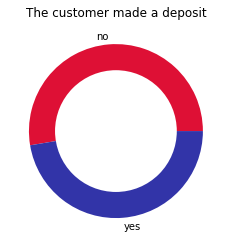

In [7]:
label = data.deposit.value_counts().index.tolist()
count_yes_no= data.deposit.value_counts().tolist()
color = ["#de1035","#3234a8"]

plt.pie(count_yes_no, colors=color, pctdistance=0.85,labels = label)

# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)

plt.title('The customer made a deposit')
  
# Displaying Char3t
plt.show()

Data is fairly **balanced**. No over/under-sampling techniques are required.

<a id='2.4'></a>
### **2.4 Shape of features**

We plotted our data to see the shape of the features an detect outliers. This is helpful to have a broad overview of the data in a graphical way.

In [8]:
data_plot = data.to_numpy()

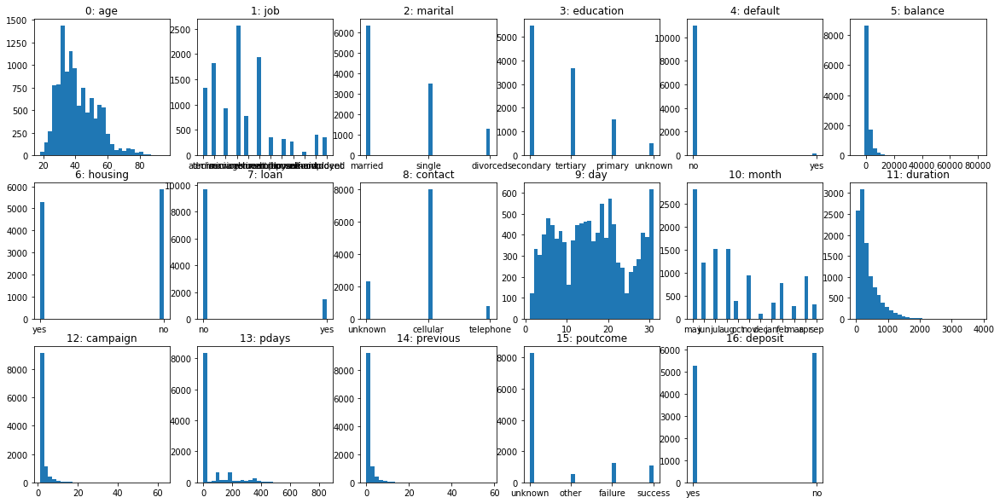

In [9]:
fig, axes = plt.subplots(3, 6, figsize=(20, 10))
for i, ax in enumerate(axes.ravel()):
    if i > 16:
        ax.set_visible(False)
        continue
    ax.hist(data_plot[:, i], bins=30)
    ax.set_title("{}: {}".format(i, data.columns[i]))

In-depth look at 'job' since it can't be clearly seen above

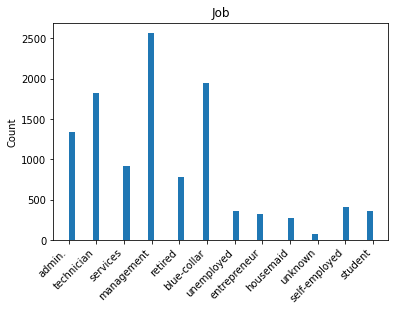

In [10]:
data.job.hist(bins=50);
plt.grid(False)
plt.xticks(rotation=45, ha='right')
plt.title("Job")
plt.ylabel("Count")
plt.show()

<a id='2.5'></a>
### **2.5 Analyze continous features**

We mainly analyze the distribution of each of the categorical features divided by the target variable to identify if there are clear differences between both distributions.

### Age

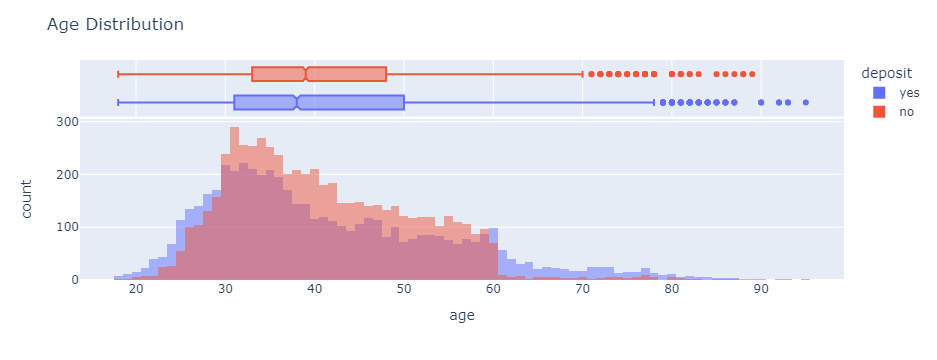

In [11]:
fig = px.histogram(data, x="age", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Age Distribution'
)
fig.show()

We can see that the median of people who say 'yes' is slightly lower than those who say 'no' while at the same time 'yes' has a distribution with fatter tails.

### Day

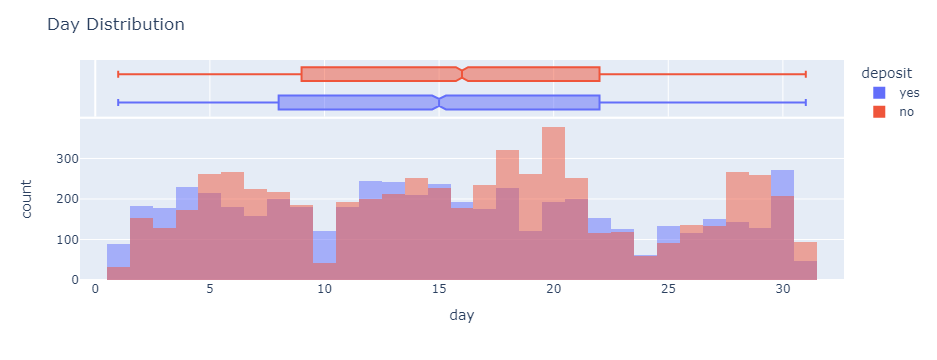

In [12]:
fig = px.histogram(data, x="day", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Day Distribution'
)
fig.show()

In the second half of the month there is an important increase in the number of rejections of the campaigns, this make sense under the assumption that most workers get paid on a monthly basis at the beggining of each month.

### Month

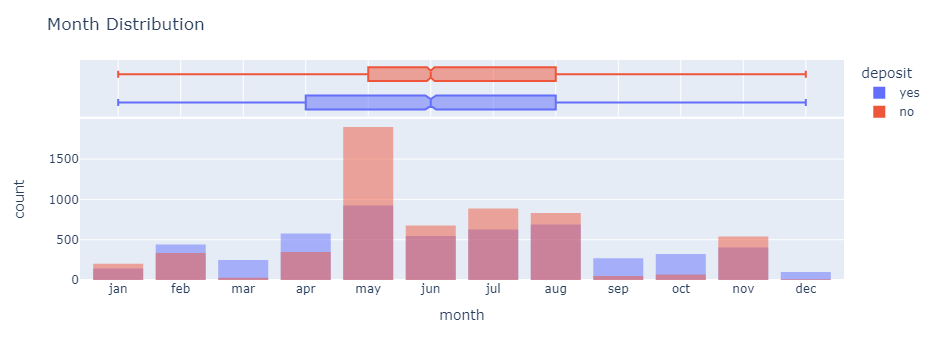

In [13]:
fig = px.histogram(data, x="month", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_xaxes(categoryorder="array", categoryarray=["jan", "feb", "mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"])
fig.update_layout(
    title_text='Month Distribution'
)
fig.show()

There are some months in which there is much more propensity to accept this deposit, and also there are some months in which there is much less propensity to accept the offer, but given the distribution we are not able to infere any particular causality.

### Balance

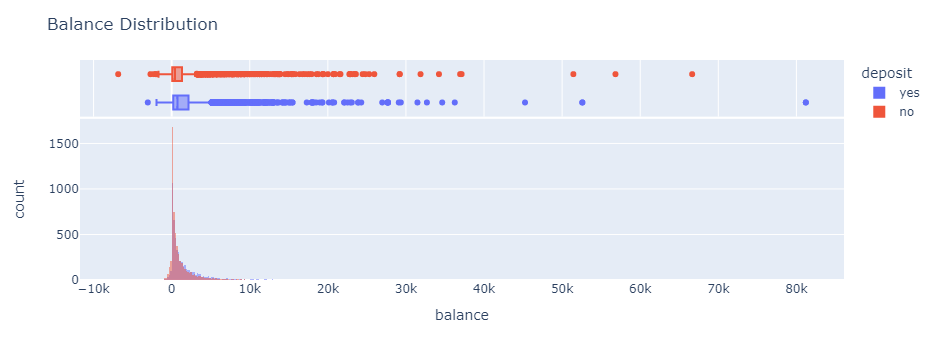

In [14]:
fig = px.histogram(data, x="balance", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Balance Distribution'
)
fig.show()

This feature is full of outliers we need to check if it is better to eliminate all of them or just the most extreme values. Given the graph, it seems that higher balance people has more probability to enter to deposit products (fatter right tail on `Yes` distribution than `No`).

### Age and balance with default

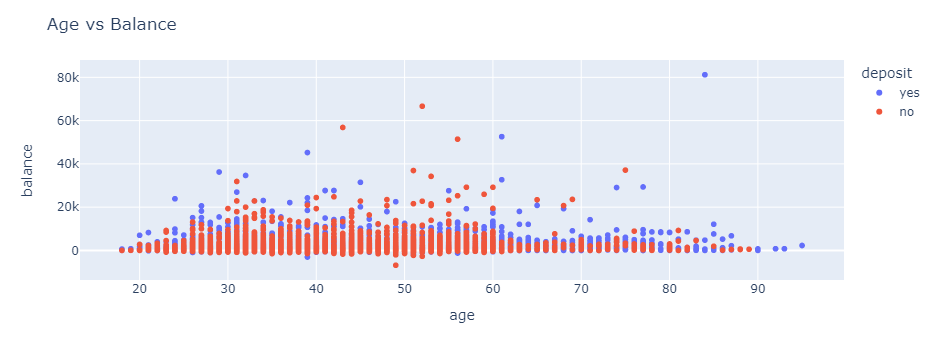

In [15]:
import plotly.express as px
fig = px.scatter(data, x="age", y="balance", color = "deposit")
fig.update_layout(
    title_text='Age vs Balance'
)
fig.show()

It does not appear to be relationship between `age` and `balance`, neither helps us to distinguish a `deposit` pattern based on this two features at the same time. Apparently, only `balance` can give us more information to distinguish the two classes. 

### Campaign

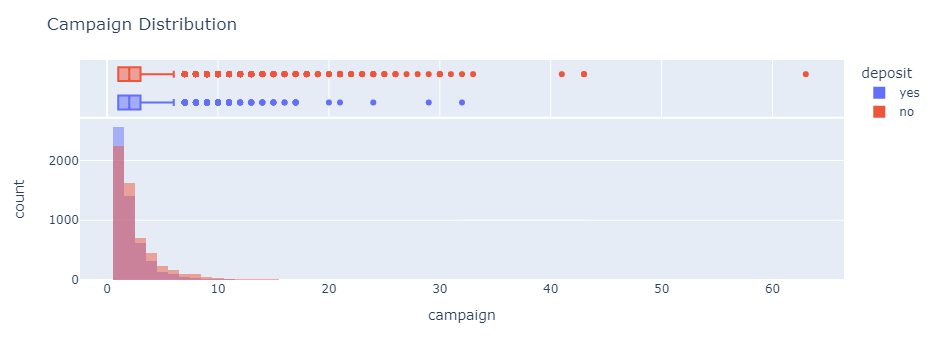

In [16]:
fig = px.histogram(data, x="campaign", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Campaign Distribution'
)
fig.show()

### Previous

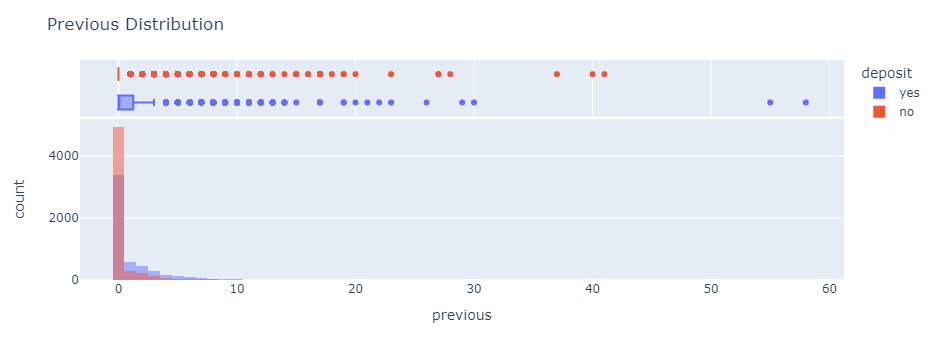

In [17]:
fig = px.histogram(data, x="previous", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Previous Distribution'
)
fig.show()

`previous` variable can have a direct relationship. There seems to be more likelihood to make a deposit if there has was previous contacts in former campaigns. People might not be impulsive and might requiere several calls to convince themselves.

### Duration

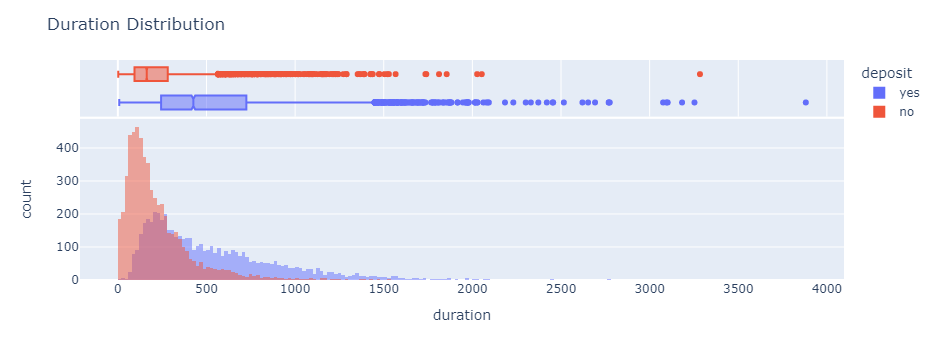

In [18]:
fig = px.histogram(data, x="duration", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Duration Distribution'
)

fig.show()

There is a clear difference between the distribution of duration given `deposit`. However, the model cannot be trained based on `duration` because we don't know in advance what will be the duration of the call and we have a very high certainty that if the duration is very small, the deposit is a `no`.
For the assignment purpose, it was agreed in class that 'duration' feature would be dropped.

### **Correlation Matrix**

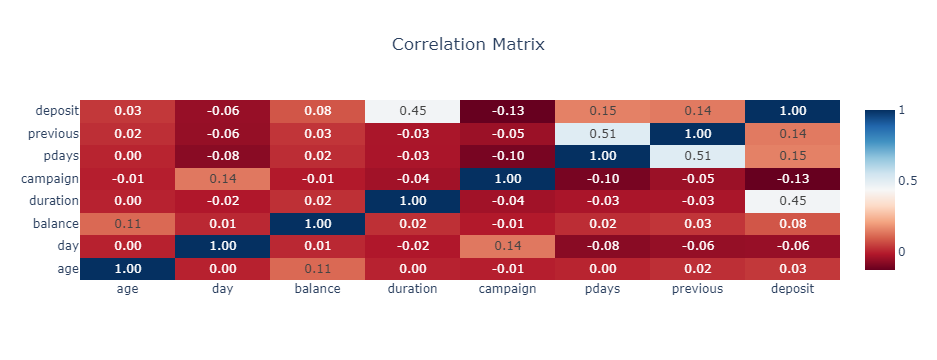

In [19]:
numerical_and_target = ["age","day","balance","duration","campaign","pdays", "previous","deposit"]

num_and_target_data = data[numerical_and_target]
num_and_target_data = pd.get_dummies(num_and_target_data, columns=["deposit"])
num_and_target_data = num_and_target_data.drop(columns = "deposit_no")
num_and_target_data = num_and_target_data.rename(columns = {"deposit_yes":"deposit"})

df_corr = num_and_target_data.corr()

fig = go.Figure()
fig.add_trace(
    go.Heatmap(
        x = num_and_target_data.columns,
        y = num_and_target_data.columns,
        z = np.array(df_corr),
        text=df_corr.values,
        texttemplate='%{text:.2f}',
        colorscale="RdBu"
    )
)
# add title
fig.update_layout(
    title_text="Correlation Matrix",
    title_x=0.5,
)
fig.show()

The features that have higher correlation with `deposit` are `duration` (correl = 0.45 and will not be used for training the model), `pdays` (correl = 0.15), `previous` (correl = 0.14) and `campaign` (correl = -0.13). It is important to consider that there is a very high correlation between `pdays` (number of days after being contacted in previous campaigns) and `previous` (number of contacts performed before this campaign) because there are >8000 (≈ 75%)  people that were not contacted previously, so both variables have the same value. We should be aware of autocorrelation over this two features (for certain models).

<a id='2.6'></a>
### **2.6 Analyze categorical features**

For this part, we ran categorical distributions divided by the target variable to see if the number of depositors increases on an specific class of the categorical feature. 

### Job

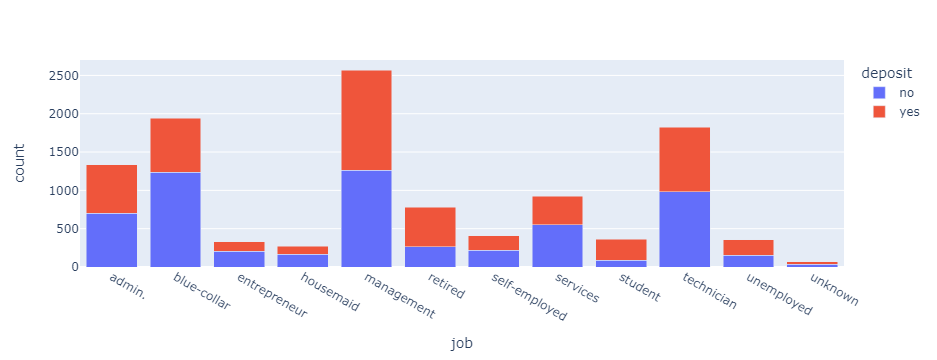

In [20]:
job_data = data.groupby(by= ['job','deposit']).count().reset_index()
job_data['count']=job_data['age']
fig = px.bar(job_data, x="job",y="count",color = "deposit",barmode="stack")
fig.show()

Some of the jobs have more likelihood to accept the deposit: `retired`, `student`, `unemployed` and some others have less likelihood to accept it: `blue_collar`, `entrepreneur`, `housemade`

### Marital Status

In [21]:
df_pie = data.groupby(["marital","deposit"]).count()
df_pie = df_pie.reset_index()

df_pie_divorced=df_pie[df_pie["marital"]=='divorced']
df_pie_married = df_pie[df_pie["marital"]=='married']
df_pie_single = df_pie[df_pie["marital"]=='single']

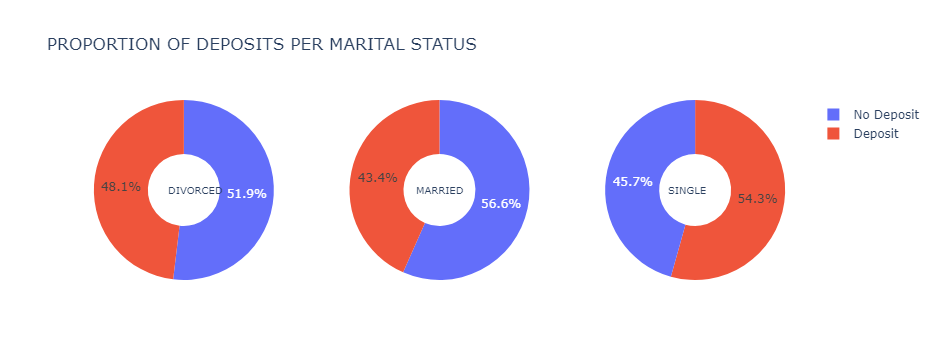

In [22]:
labels = ["No Deposit","Deposit"]
fig = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels = labels,values=df_pie_divorced.age, name="divorced"),
              1, 1)
fig.add_trace(go.Pie(labels = labels ,values=df_pie_married.age, name="married"),
              1, 2)
fig.add_trace(go.Pie(labels = labels ,values=df_pie_single.age, name="single"),
              1, 3)


# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="PROPORTION OF DEPOSITS PER MARITAL STATUS",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='DIVORCED', x=0.12, y=0.5, font_size=10, showarrow=False),
                 dict(text='MARRIED', x=0.5, y=0.5, font_size=10, showarrow=False),
                dict(text='SINGLE', x=0.875, y=0.5, font_size=10, showarrow=False)])

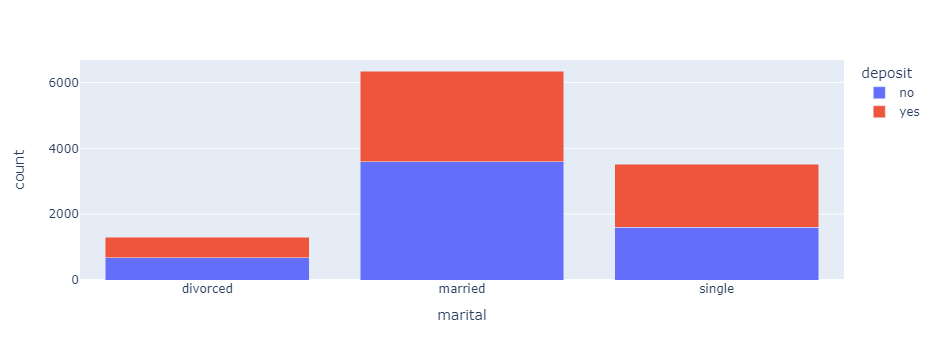

In [23]:
marital_data = data.groupby(by= ['marital','deposit']).count().reset_index()
marital_data['count']=marital_data['age']
fig = px.bar(marital_data, x="marital",y="count",color = "deposit",barmode="stack")
fig.show()

There is more liklihood that a single person **ACCEPTS** the deposit offered (54.3% of acceptance); however, there is more likelihood that a single person **REJECTS** the deposit offered (56.6% of rejection)

### Default

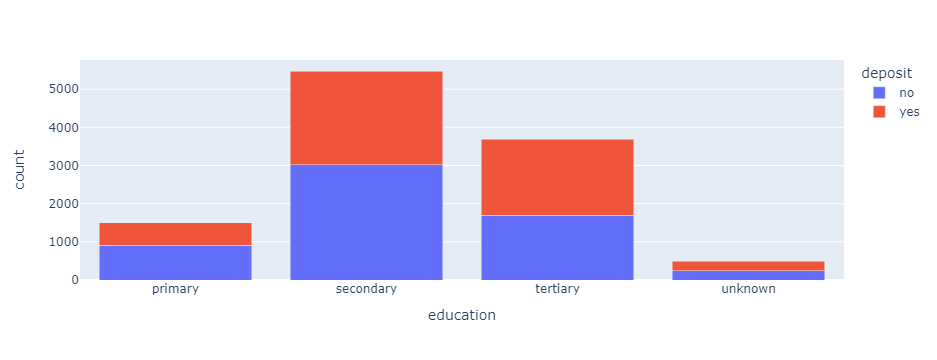

In [24]:
educ_data = data.groupby(by= ['education','deposit']).count().reset_index()
educ_data['count']=educ_data['age']
fig = px.bar(educ_data, x="education",y="count",color = "deposit",barmode="stack")
fig.show()

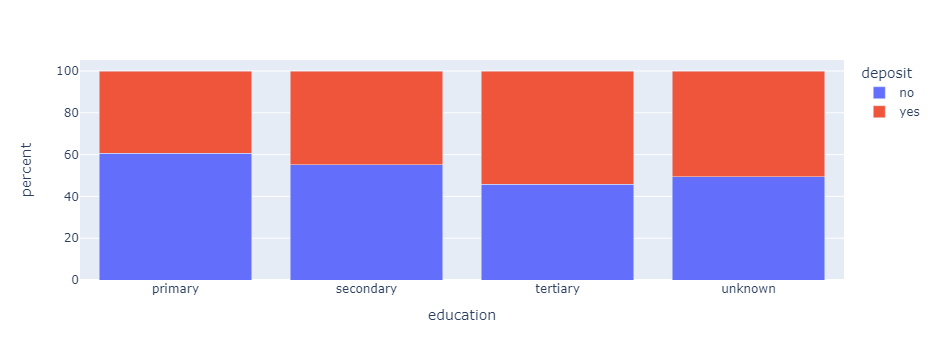

In [25]:
edudf = data.groupby(['education','deposit']).size().reset_index(name='counts')
edudf['percent'] = edudf.groupby('education')['counts'].apply(lambda x: 100 * x / float(x.sum()))
fig = px.bar(edudf, x="education", y="percent", color='deposit', barmode='stack')
fig.show()

As education level increases, the probability of accepting the deposit also does. There might be multiple reasons to explain this such as financial-education, or if we were to match education level with wealth, ppl with less education might not choose the product since their disposable income is spent and not saved.
##### Lucky us, unkwown cases are few and equally distributed regarding our independent variable.

### Personal Loan

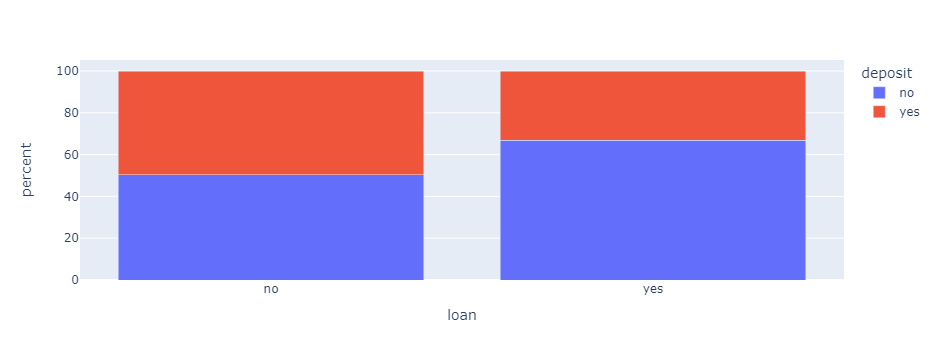

In [26]:
dfcont = data.groupby(['loan','deposit']).size().reset_index(name='counts')
dfcont['percent'] = dfcont.groupby('loan')['counts'].apply(lambda x: 100 * x / float(x.sum()))
fig = px.bar(dfcont, x="loan", y="percent", color='deposit', barmode='stack')
fig.show()


In [27]:
dfcont.head()

,loan,deposit,counts,percent
0,no,no,4897,50.474129
1,no,yes,4805,49.525871
2,yes,no,976,66.849315
3,yes,yes,484,33.150685


##### Most of the samples do not have a personal loan. If the person already have a personal loan it might decrease the probability of accepting the deposit offer.

### Contact

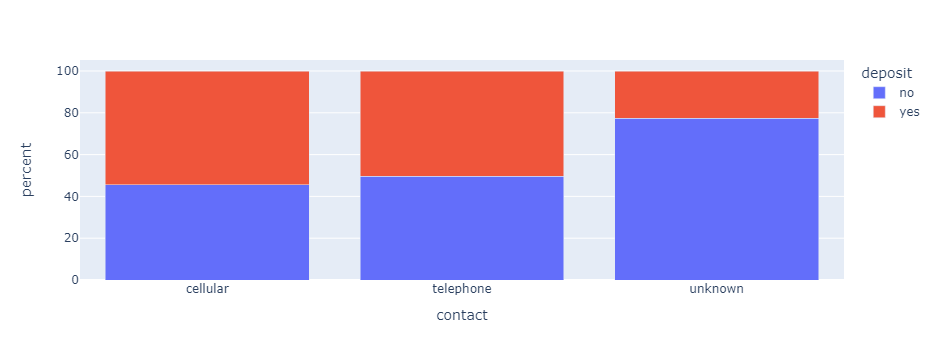

In [28]:
dfcont = data.groupby(['contact','deposit']).size().reset_index(name='counts')
dfcont['percent'] = dfcont.groupby('contact')['counts'].apply(lambda x: 100 * x / float(x.sum()))
fig = px.bar(dfcont, x="contact", y="percent", color='deposit', barmode='stack')
fig.show()


In [29]:
dfcont.head()

,contact,deposit,counts,percent
0,cellular,no,3673,45.672718
1,cellular,yes,4369,54.327282
2,telephone,no,384,49.612403
3,telephone,yes,390,50.387597
4,unknown,no,1816,77.408355


#### Most of the samples were contacted to the cellular. Unknown reprsent slightly above 10% but is pretty unbalanced.

<a id='2.7'></a>
### **2.7 Conclusions**

### A) Dataset is pretty clean with no missing values. Also there are no NULL values but "unknowns" should be taken care of.
### B) Dataset contains a mix of numerical & categorical variables:
###         Categorical variables should be transformed since they are in strings.
###         Numerical variables should have a consideration both for outliers and scaling.
### C) Pandas Profile shows us that we have high correlations between variables, same as correlation matrix.
### D) Regarding data-leakeage, "duration" is a particular feature since its highly correlated to the independent variable but we  would only get it ex-post, so we should be careful while treating this variable.
### E) Dataset is fairly balanced regarding the independent variable 

<a id='3'></a>
## **3. Data Cleaning & Preprocessing**

<a id='3.0'></a>
### **3.0 Dealing with NULL values**

Previously we mentioned that the data does not contain NULL values, but it contains **unknown** values that we have to study more in depth to see if we can keep it as an additional class, or do not have any meaning and we should impute or delete these values. The features that contain **unknown** values are `[education, job, contact, poutcome]`. For the computation of the baseline model, we decided to keep unknown as a class and we deal with these values in the **feature engineering** part.

<a id='3.1'></a>
### **3.1 Encoding categorical features**

Since most categorial features were strings, we encoded them in order to serve the models.

In [30]:
categorical_features = ["job","marital","education","default","housing","loan","contact","poutcome","month"]
categorical_data = data[categorical_features]
categorical_data_encoded = pd.get_dummies(categorical_data, drop_first = True)

numerical_features = ["age","balance","day","campaign","pdays","previous"]
numerical_data= data[numerical_features]

categorical_data_encoded[numerical_features] = numerical_data

X_encoded = categorical_data_encoded

<a id='3.2'></a>
### **3.2 Deleting 'deposit' feature**

Deleted `deposit` from the df

In [31]:
target = pd.get_dummies(data['deposit'], drop_first=True)
target = pd.Series(target.yes)

<a id='3.3'></a>
### **3.3 Rescaling**

Given that the base model we will evaluate is a Logistic Regression, we will rescale the features in order to fit the linear model in a proper way. We are also rescaling because we will deal with other models that requires rescaling for performing good (KNNs) 

In [32]:
scl = StandardScaler()
scl.fit(numerical_data)
X_scaled = categorical_data_encoded
num_scl = scl.transform(X_scaled[numerical_features])
X_scaled[["age","balance","day","campaign","pdays","previous"]] = num_scl

categorical_features = ["job","marital","education","default","housing","loan","contact","poutcome","month"]
categorical_data = data[categorical_features]

categorical_data_encoded = pd.get_dummies(categorical_data, drop_first = True)

#duration was deleted from the model.
numerical_features = ["age","balance","day","campaign","pdays","previous"]
numerical_data= data[numerical_features]
categorical_data_encoded[numerical_features] = numerical_data
X = categorical_data_encoded

<a id='4'></a>
## **4. Baseline Model**

<a id='4.0'></a>
#### **4.0 Split Train/Test**

We did the split on a 80/20 ratio.

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, target, test_size=0.2, random_state=123)

<a id='4.1'></a>
#### **4.1 Logistic Regression**

We ran a basic logistic regression without any feature engineering or hyperparameter tunning. We scaled the numeric variables to improve the performance of the model.

In [34]:
lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")
print(f"\nAccuracy: {accuracy_score(y_train, y_pred)}")


lr.fit(X_train,y_train)


ROC_AUC: 0.6958

Accuracy: 0.7029902564676895


LogisticRegression(random_state=123)

We obtained an **accuracy of  0.7** and an **area under the curve of 0.69.** This is the baseline we will try to improve using feature engineering and model selection. We base the performing of the model basically on the accuracy because the dataset is well balanced and in this case the accuracy is a good metric of model performance.

<a id='5'></a>
## **5. Feature Engineering**

Given our baseline, we started to dig-in the feature engineering to modify the features in order to get an improved score.

<a id='5.0'></a>
#### **5.0 Feature Importance**

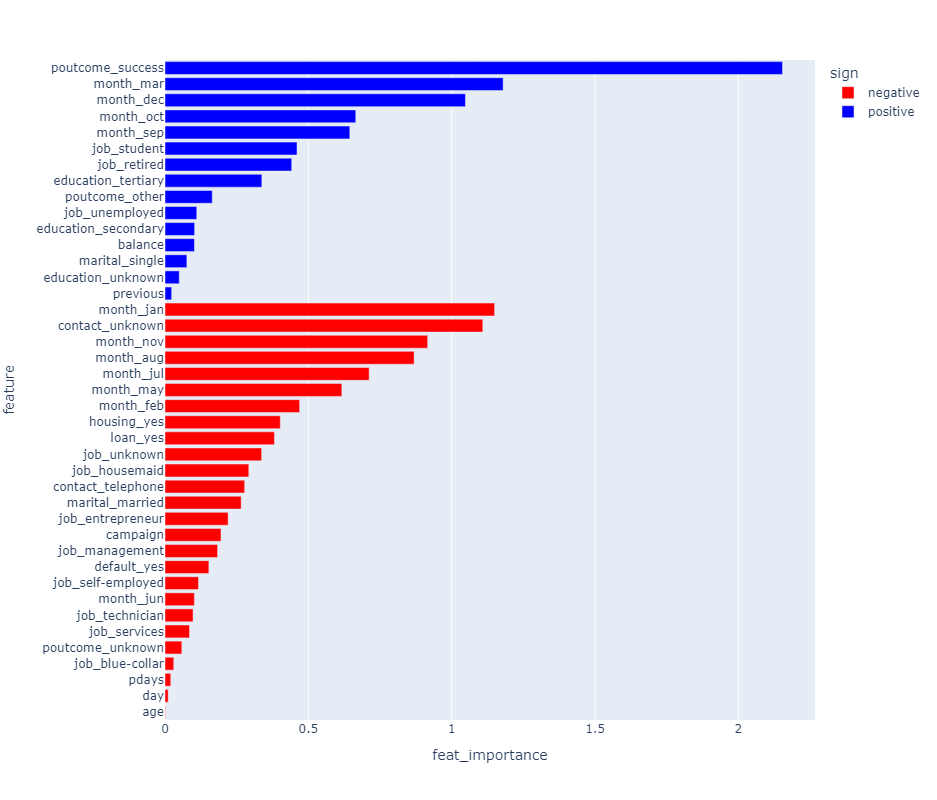

In [35]:
importance = lr.coef_
importance = importance[0]
df_importance = pd.DataFrame({"feature":X_train.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)
df_importance['sign'] = 0
df_importance['sign'][df_importance['importance']>=0] = "positive"
df_importance['sign'][df_importance['importance']<0] = "negative"

import plotly.express as px
fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature", color = "sign",orientation='h',color_discrete_sequence=["red", "blue"], width=800, height=800)

fig.show()

The months of the year have very high relevance over all the models. We will deal with them on the feature engineering part, however, apart from them, there are many other features that have a high relevance.

The most relevant features (positively related) identified on the base model are:
- `poutcome_success`: which indicates that the client has accepted a previous marketing campaign.
- `job_retired`: which indicates that the client is retired.
- `job_student`: which indicates that the client is a student.

The most relevant features (negatively related) identified on the base model are:
- `contact_unknown`: which indicates that the bank does not know how did they contact the client.
- `housing_yes`: which indicates that the client has a housing loan.
- `loan_yes`: which indicates that the client has a personal loan.
- `job_unknown`: which indicates that the the bank does not know what is the client's job.

<a id='5.1'></a>
#### **5.1 Dealing with Unknown values**

As seen on the EDA, there are some Unkown values that have to be treated.

<a id='5.1.a'></a>
#### **5.1.a CONTACT**

Given that we identified that `contact_unknown` is a highly relevant feature on our base model, we will analyze the original feature (`contact`) more in detail. 

In [36]:
data.contact.value_counts()

cellular     8042
unknown      2346
telephone     774
Name: contact, dtype: int64

This feature contains a > 21% of unknown values, which could be treated as a new category. From a business perpective, it can be understood as not knowing the source of contact can reduce the likelihood of this client to accept the deposit. This make sense because probably the client was not involved enough with the company and did not provide enough information to the bank (meaning the person might not be very interested). 

Given the mentioned on the previous lines, we decided to keep this feature as is.

<a id='5.1.b'></a>
#### **5.1.b EDUCATION**

There are 497 (≈ 4.5%) **unknown** observations. We have to evaluate  where these values come from

We use the KNN approach to impute the unknown values based on the results obtained by the model.

In [37]:
#X_scaled_fe1 = X_scaled_fe1.drop(columns = ['education_secondary','education_tertiary','education_unknown'])
X_scaled_fe1 = X_scaled.drop(columns = ['education_secondary','education_tertiary','education_unknown'])
X_scaled_fe1['education'] = data.education
X_scaled_fe1['job'] = data.job
X_scaled_fe1['month'] = data.month
X_scaled_fe1.replace({"primary":0,"secondary":1,"tertiary":2,"unknown": np.NaN}, inplace=True)
X_scaled_fe1['deposit'] = target

X_educ_train = X_scaled_fe1[X_scaled_fe1.education.notnull()]
target_train = X_educ_train['deposit']
job_train = X_educ_train['job']
month_train = X_educ_train['month']


X_educ_test = X_scaled_fe1[X_scaled_fe1.education.isnull()]
target_test = X_educ_test['deposit']
job_test = X_educ_test['job']
month_test = X_educ_test['month']

target_educ = X_educ_train.education

X_educ_train = X_educ_train.drop(columns = ["education",'deposit','job','month']) 
X_educ_test = X_educ_test.drop(columns = ['deposit','job','month'])
knn =  KNeighborsClassifier(n_neighbors = 5)
knn.fit(X_educ_train, target_educ) 

knn.score(X_educ_train, target_educ)

0.7737458977965307

In [38]:
print("Accuracy = {:.4}".format(
    np.mean(cross_val_score(knn, X_educ_train, target_educ, cv=5))))

Accuracy = 0.6563


In [39]:
X_educ_train.loan_yes.value_counts()

0    9231
1    1434
Name: loan_yes, dtype: int64

There is an important difference between the accuracy of the model using the whole dataset and the accuracy with the cross validation. This may happen because the random spliting is not working properly due to the big disproportion of some important features like `loan` which has a  87% of clients that don't have a personal loan and 13% of people that have a personal loan.

To overcome this problem we will evaluate the model for education over an stratified splitting, taking into account the disproportion of this feature and evaluate if this approach performs better.

In [40]:
X_educ_train['education'] = target_educ
X_educ_train.education=X_educ_train.education.astype(int)
X_educ_train = X_educ_train.reset_index()
X_educ_train = X_educ_train.drop(columns = "index")

from sklearn.model_selection import StratifiedShuffleSplit
# Here we split the data into training and test sets and implement a stratified shuffle split.
stratified = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_set, test_set in stratified.split(X_educ_train, X_educ_train["loan_yes"]):
    stratified_train = X_educ_train.loc[train_set]
    stratified_test = X_educ_train.loc[test_set]
    
print(stratified_train["loan_yes"].value_counts()/len(stratified_train))
print(stratified_test["loan_yes"].value_counts()/len(stratified_test))

0    0.865565
1    0.134435
Name: loan_yes, dtype: float64
0    0.865448
1    0.134552
Name: loan_yes, dtype: float64


In [41]:
stratified_train_target = stratified_train['education']
stratified_train = stratified_train.drop(columns = 'education')

stratified_test_target = stratified_test['education']
stratified_test = stratified_test.drop(columns = 'education')

To determine the optimal number of neighbors, we want to maximize the accuracy over the test set (in order to avoid overfitting), so for tunning the hyperparameter, we develop a iteration over the total number of neighbors

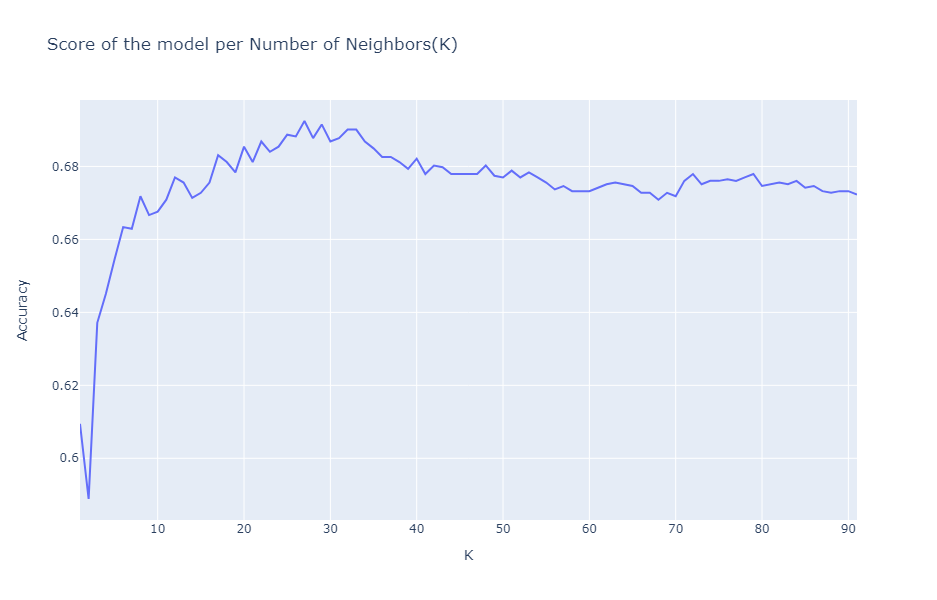

In [42]:
accuracy = {}
max_k = int(round(np.sqrt(len(stratified_train)+10),0))
for i in range(1,max_k):
    knn =  KNeighborsClassifier(n_neighbors = i)
    knn.fit(stratified_train, stratified_train_target)
    st_test_pred = knn.predict(stratified_test)
    accuracy[i] = accuracy_score(stratified_test_target, st_test_pred)

df_knn = pd.DataFrame(accuracy.items() )
df_knn=df_knn.rename(columns = {0:'K',1:'Accuracy'})
fig = px.line(df_knn, x='K', y='Accuracy',width=800, height=600, title = "Score of the model per Number of Neighbors(K)")

fig.show()

The maximum accuracy is at K = 27, so we will use this hyperparameter for imputing the unknown observations on `education`.

In [43]:
education = X_educ_train.education
X_educ_train = X_educ_train.drop(columns= 'education')
knn_o =  KNeighborsClassifier(n_neighbors = 27)
knn_o.fit(X_educ_train, target_educ)
X_educ_test = X_educ_test.drop(columns = "education")
na_educ_prediction = knn_o.predict(X_educ_test)

X_educ_train['education'] = education
X_educ_test['education'] = na_educ_prediction
target = pd.concat([target_train, target_test], ignore_index = True)
X_scaled_fe2 = pd.concat([X_educ_train, X_educ_test], ignore_index = True)

scl = StandardScaler()
scl.fit(X_scaled_fe2[['education']])
X_scaled_fe2.education = scl.transform(X_scaled_fe2[['education']])

X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe2, target, test_size=0.2, random_state=123)

lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.6946


0.7078060253107851

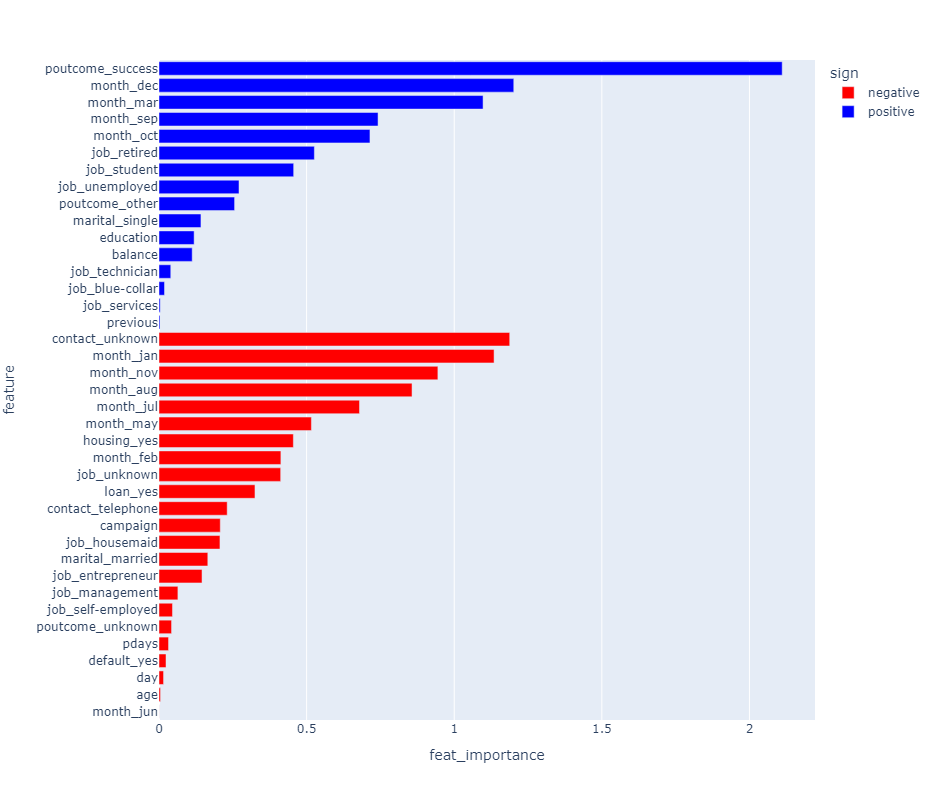

In [44]:
importance = lr.coef_
importance = importance[0]

df_importance = pd.DataFrame({"feature":X_train.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)
df_importance['sign'] = 0
df_importance['sign'][df_importance['importance']>=0] = "positive"
df_importance['sign'][df_importance['importance']<0] = "negative"


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature", color = "sign",orientation='h',  color_discrete_sequence=["red", "blue"],width=800, height=800)

fig.show()

The imputation over `education` feature improved the accuracy of the model in 0.05 percentage points. Which means that the imputation of the education level has a positive impact over the model performance.

<a id='5.1.c'></a>
#### **5.1.c POUTCOME**

In [45]:
data.poutcome.value_counts()

unknown    8326
failure    1228
success    1071
other       537
Name: poutcome, dtype: int64

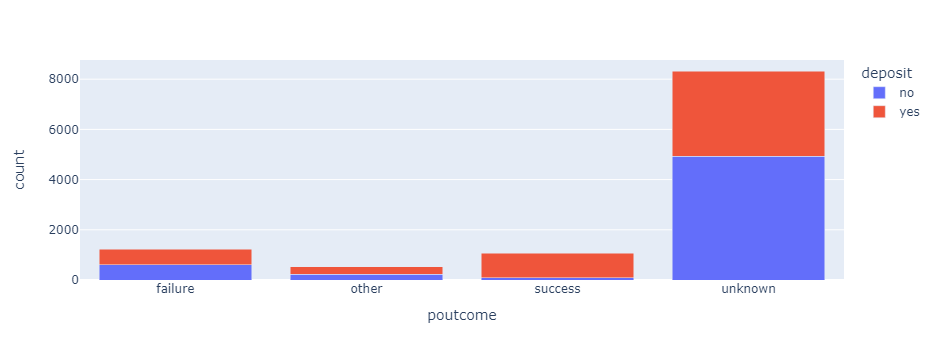

In [46]:
poutcome_data = data.groupby(by= ['poutcome','deposit']).count().reset_index()
poutcome_data['count']=poutcome_data['age']
fig = px.bar(poutcome_data, x="poutcome",y="count",color = "deposit",barmode="stack")
fig.show()

In [47]:
poutcome_data = data.groupby(by= ['poutcome','deposit']).mean().reset_index()
poutcome_data[poutcome_data['poutcome']=='unknown'][['poutcome','deposit','previous']]

,poutcome,deposit,previous
6,unknown,no,0.000000
7,unknown,yes,0.000886


We have seen that the category success of `poutcome` feature is the most important, however there is a very small proportion of the dataset and that is why we cannot extract higher conclusions over this feature and we verified that the unknown class is consistent with the fact that this clients have not been contacted in previous campaigns, so we cannot create a proxy feature based on the potential output that this feature could give (These clients were never contacted in previous campaigns). We will keep the feature as it is

<a id='5.2'></a>
#### **5.2 Dealing with Outliers**

<a id='5.2.a'></a>
#### **5.2.a BALANCE**

As we have seen the main feature that contain significant outliers is the `balance` feature. It can be seen that people with higher account balance tend to increase the likelihood of accepting the term deposit; however, there are some outliers that might distort this relationship given that there seems to be more observations with a balance above USD 15K who have rejected term deposit and this migh distort the relationship that appears in the medium-high balance zone of the ditribution. Our approach will be recoding this outliers to 15000. Given that the distribution is already right skewed, there won't be any change on the distribution.

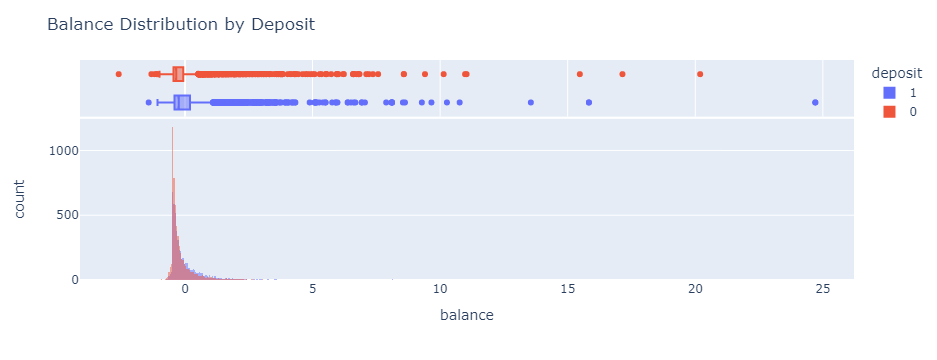

In [48]:
X_scaled_fe2['deposit'] = target
fig = px.histogram(X_scaled_fe2, x="balance", marginal = 'box',color = "deposit",barmode="overlay")
# add title
fig.update_layout(
    title_text='Balance Distribution by Deposit'
) 
fig.show()

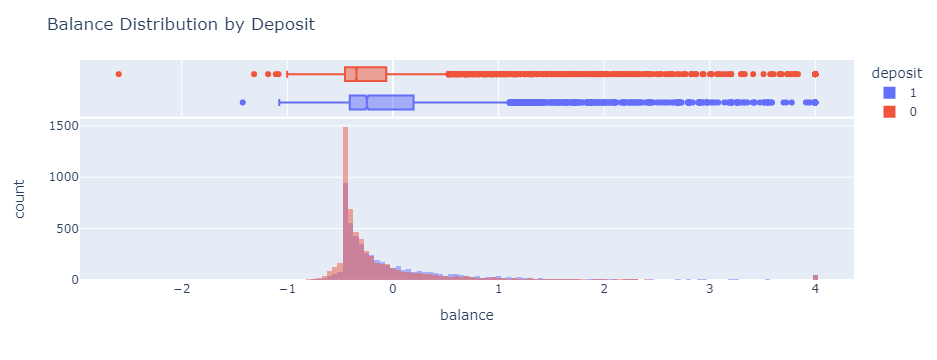

In [49]:
#We are applying the transformation directly to the scaled features

X_scaled_fe3 = X_scaled_fe2
X_scaled_fe3['balance'].mask(X_scaled_fe3['balance']>4,4,inplace=True)

fig = px.histogram(X_scaled_fe3, x="balance", marginal = 'box',color = "deposit",barmode="overlay")

fig.update_layout(
    title_text='Balance Distribution by Deposit'
)
fig.show()

In [50]:
X_scaled_fe3 = X_scaled_fe3.drop(columns = 'deposit')

X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe3, target, test_size=0.2, random_state=123)

lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.6958


0.7092619554261396

The accuracy improved in approximately 0.02 with respect to the accuracy of the education feature engineering model.

We also tried to discretize the balance depending on the behavior of depositors:

- Low income = 0: <-0.375 on scaled basis
- Medium income = 1: > - 0.375 and < 1.22
- High income = 2: > 1.22

Discretizing the features did not work (Acc. below than with the continuous feature) so we will keep `balance` as-is.

<a id='5.2.b'></a>
#### **5.2.b PREVIOUS**

Another feature that have some outliers that might affect the distribution is `previous`. We will check at the scaled distribution to identify those outliers.

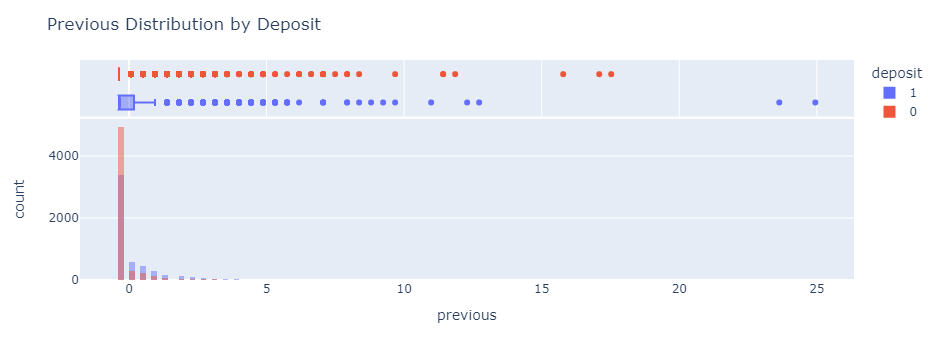

In [51]:
X_scaled_fe3['deposit'] = target
fig = px.histogram(X_scaled_fe3, x="previous", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Previous Distribution by Deposit'
)
fig.show()

In this case, values higher than 10 (on a scaled basis) will be imputed to 10 to reduce the skewness of the distribution.

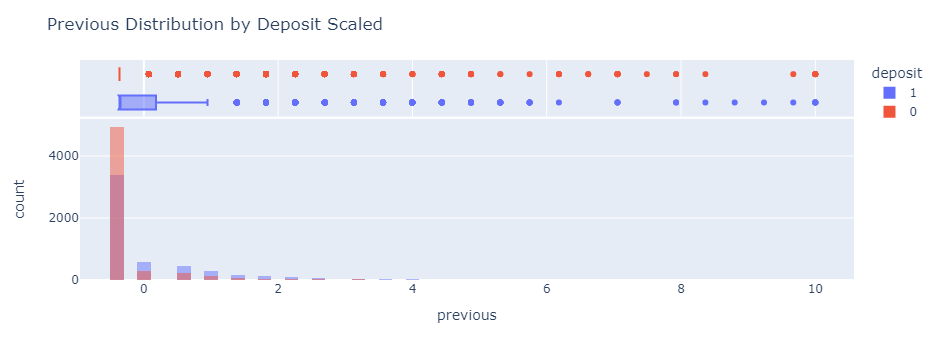

In [52]:
X_scaled_fe3['previous'].mask(X_scaled_fe3['previous']>10,10,inplace=True)
fig = px.histogram(X_scaled_fe3, x="previous", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Previous Distribution by Deposit Scaled'
)
fig.show()

In [53]:
X_scaled_fe3 = X_scaled_fe3.drop(columns = 'deposit')
X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe3, target, test_size=0.2, random_state=123)

lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.6962


0.7092619554261396

The model did not improve with respect to the previous feature engineering, most likely because there were not too many observations to remove and did not change the shape of the distribution but still helped marginally.

<a id='5.2.c'></a>
#### **5.2.c CAMPAIGN**

Another feature that have some outliers that might affect the distribution is `campaign`. We will check at the scaled distribution to identify those outliers.

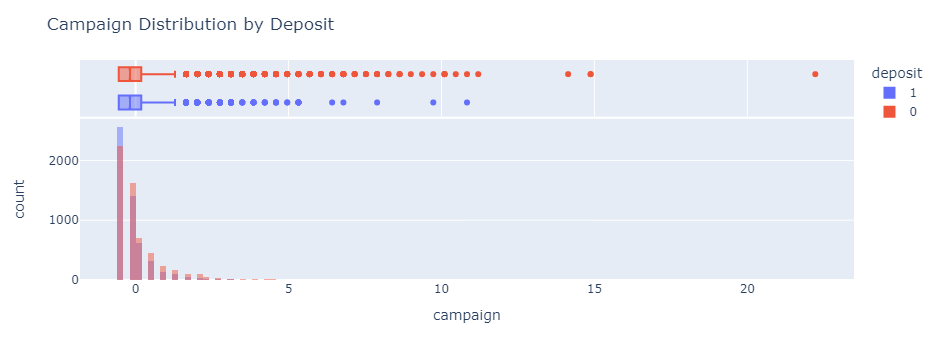

In [54]:
X_scaled_fe3['deposit'] = target
fig = px.histogram(X_scaled_fe3, x="campaign", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Campaign Distribution by Deposit'
)
fig.show()

In this case, values higher than 8 (on a scaled basis) will be imputed to 8 to reduce the skewness of the distribution.

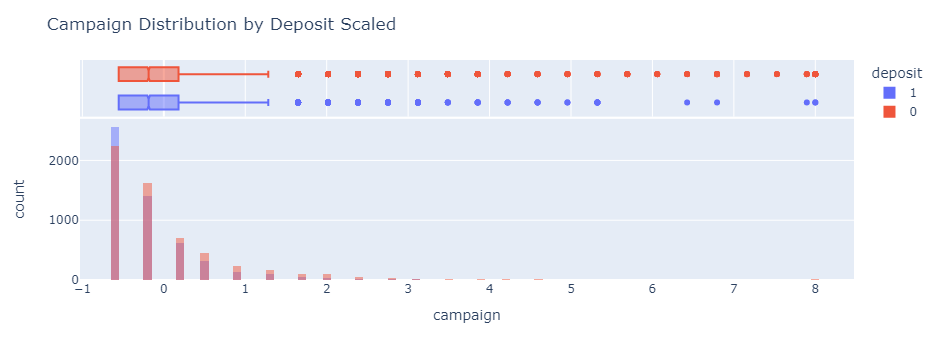

In [55]:
X_scaled_fe3['campaign'].mask(X_scaled_fe3['campaign']>8,8,inplace=True)
fig = px.histogram(X_scaled_fe3, x="campaign", marginal = 'box',color = "deposit",barmode="overlay")
fig.update_layout(
    title_text='Campaign Distribution by Deposit Scaled'
)
fig.show()

In [56]:
X_scaled_fe3 = X_scaled_fe3.drop(columns = 'deposit')
X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe3, target, test_size=0.2, random_state=123)

lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.6964


0.7095979392989137

The model improved in a very small amount with respect to the previous feature engineering, most likely because there were not too many observations to remove and did not change the shape of the distribution.

<a id='5.3'></a>
#### **5.3 In-Depth Analysis of features**

<a id='5.3.a'></a>
#### **5.3.a JOB**

Given that many categories of job are important features for the base model and given that there is a high dimesionality over this jobs, we will try to create a differente encoding over `job` feature. We will try a target encoding using the proportion of depositors over each of the job categories. 

In [57]:
X_scaled_fe4 = X_scaled_fe3
job = pd.concat([job_train,job_test],ignore_index=True)
X_scaled_fe4['job'] = job
enc = TargetEncoder(cols=['job'], min_samples_leaf=20, smoothing=10).fit(X_scaled_fe4, target)
X_scaled_fe4 = enc.transform(X_scaled_fe4)
X_scaled_fe4 = X_scaled_fe4.drop(columns = ['job_blue-collar','job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired','job_self-employed','job_services', 'job_student', 'job_technician', 'job_unemployed','job_unknown'])

scl = StandardScaler()
scl.fit(X_scaled_fe4[['job']])
X_scaled_fe4.job = scl.transform(X_scaled_fe4[['job']])

X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe4, target, test_size=0.2, random_state=123)

lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.6992


0.7129577780266547

Although this approach did not improve the model, it did not reduce the accuracy dramatically and this technique helps us to reduce the dimensionality of the model and also helps for the interpretability of it. We will try the target indexing for the months too. 

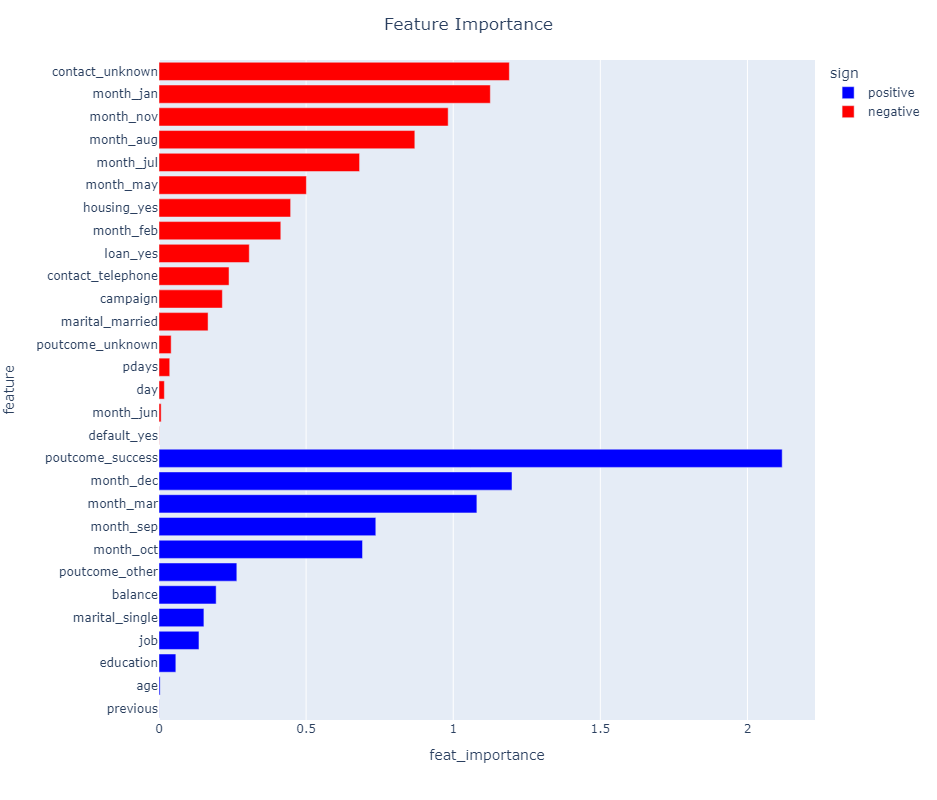

In [58]:
importance = lr.coef_
importance = importance[0]

df_importance = pd.DataFrame({"feature":X_train.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)
df_importance['sign'] = 0
df_importance['sign'][df_importance['importance']>=0] = "positive"
df_importance['sign'][df_importance['importance']<0] = "negative"


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature", color = "sign",orientation='h',  color_discrete_sequence=["blue", "red"],width=800, height=800)
fig.update_layout(
    title_text='Feature Importance',
    title_x=0.5,
)
fig.show()

<a id='5.3.b'></a>
#### **5.3.b MONTH**

Given that many months are important features for the base model and given that there is a high dimesionalit, we will try to create a differente encoding over `month` feature. We will try a target encoding using the proportion of depositors over each of the job categories. 

In [59]:
X_scaled_fe5 = X_scaled_fe4

month = pd.concat([month_train,month_test],ignore_index=True)

X_scaled_fe5['month'] = month
enc = TargetEncoder(cols=['month'], min_samples_leaf=20, smoothing=10).fit(X_scaled_fe5, target)
X_scaled_fe5 = enc.transform(X_scaled_fe5)
X_scaled_fe5 = X_scaled_fe5.drop(columns = ['month_aug','month_dec','month_feb','month_jan','month_jul', 'month_jun','month_mar','month_may' ,'month_nov','month_oct','month_sep'])
scl = StandardScaler()
scl.fit(X_scaled_fe5[['month']])
X_scaled_fe5.month = scl.transform(X_scaled_fe5[['month']])

X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe5, target, test_size=0.2, random_state=123)

lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.6933


0.7026542725949154

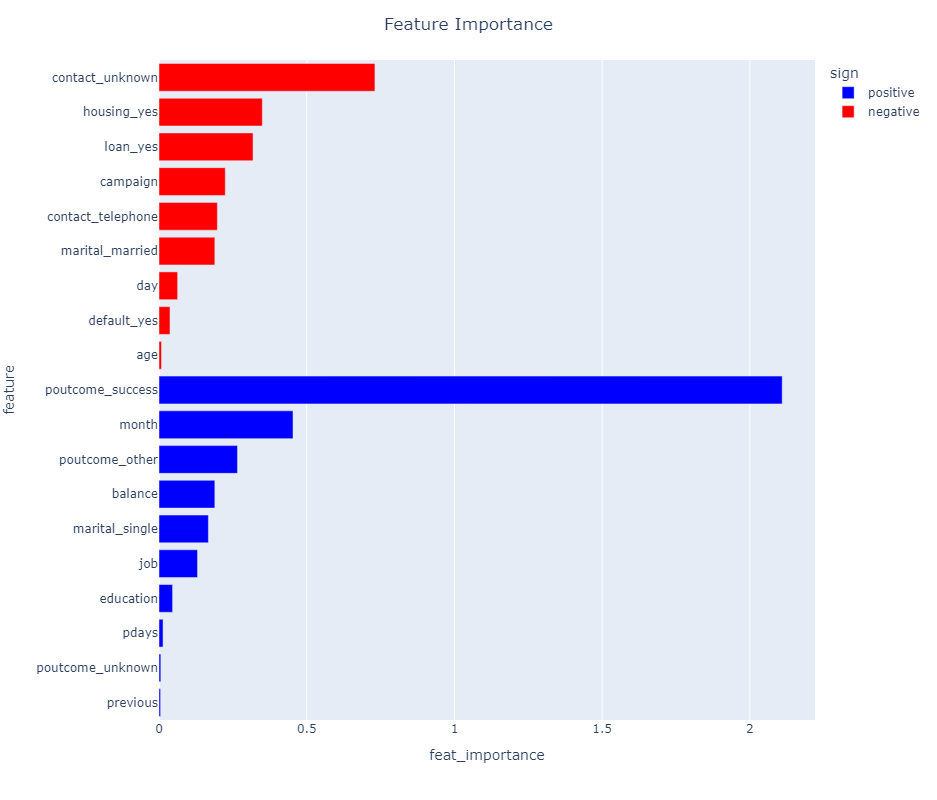

In [60]:
importance = lr.coef_
importance = importance[0]

df_importance = pd.DataFrame({"feature":X_train.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)
df_importance['sign'] = 0
df_importance['sign'][df_importance['importance']>=0] = "positive"
df_importance['sign'][df_importance['importance']<0] = "negative"


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature", color = "sign",orientation='h',  color_discrete_sequence=["blue", "red"],width=800, height=800)
fig.update_layout(
    title_text='Feature Importance',
    title_x=0.5,
)
fig.show()

<a id='5.3.c'></a>
#### **5.3.c DAYS**

We are planning to capture the days that are good for calling the client. Usually before the 15th of the month. So we will discretize the feature to see if it improves the model.

Unfortunately this approach reduced the accuracy of the model, so it will be discarded from the final model.

<a id='5.4'></a>
#### **5.4 Interaction between features**

In some cases, the interaction between features can help to improve the accuracy of the model and can be totally explainable from a business perspective. Because the dimensionality is low, we will explore the interaction between the features without increasing so much the number of features.

In [61]:
X_scaled_fe6=pd.DataFrame(X_scaled_fe5) 
names_X_scaled = X_scaled_fe6.columns
poly = PolynomialFeatures(degree=2,interaction_only=True)
X_scaled_fe_int = poly.fit_transform(X_scaled_fe6)
df_X_scaled_fe_int = pd.DataFrame(X_scaled_fe_int).reset_index()
df_X_scaled_fe_int = df_X_scaled_fe_int.drop(columns= 'index')
names_interaction = poly.get_feature_names(names_X_scaled)
df_X_scaled_fe_int.columns = names_interaction
df_X_scaled_fe_int = df_X_scaled_fe_int.drop(columns = "1")
names_interactions = df_X_scaled_fe_int.columns
X_scaled_fe6[names_interactions] = df_X_scaled_fe_int
X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe6, target, test_size=0.2, random_state=123,)
lr = LogisticRegression(random_state = 123, solver='liblinear')

In [62]:
y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.7046


0.7215813640945234

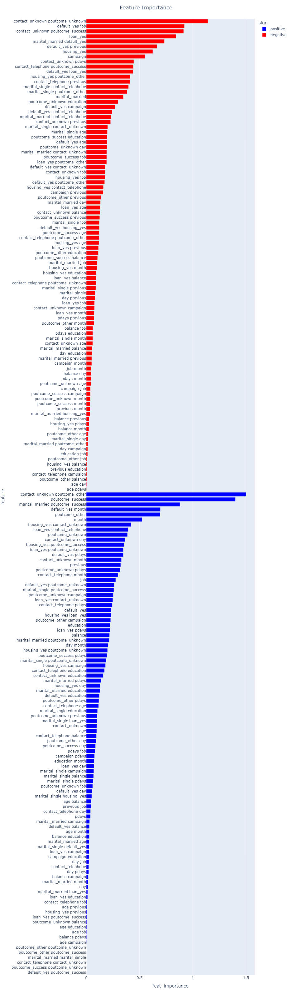

In [63]:
importance = lr.coef_
importance = importance[0]

df_importance = pd.DataFrame({"feature":X_train.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)
df_importance['sign'] = 0
df_importance['sign'][df_importance['importance']>=0] = "positive"
df_importance['sign'][df_importance['importance']<0] = "negative"


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature", color = "sign",orientation='h',  color_discrete_sequence=["blue", "red"],width=800, height=3200)
fig.update_layout(
    title_text='Feature Importance',
    title_x=0.5,
)
fig.show()

The idea behind this approach is to keep the interactions that are more relevants for the model to avoid having a high dimensionality over the model.

The interactions we are keeping are: 
- `contact_unknown poutcome_unknown`
- `default_yes job`
- `contact_unknown poutcome_success`
- `contact_unknown poutcome_other`
- `marital_married poutcome_success`
- `default_yes month`

In [64]:
X_scaled_fe5 = X_scaled_fe4

month = pd.concat([month_train,month_test],ignore_index=True)

X_scaled_fe5['month'] = month
enc = TargetEncoder(cols=['month'], min_samples_leaf=20, smoothing=10).fit(X_scaled_fe5, target)
X_scaled_fe5 = enc.transform(X_scaled_fe5)

X_scaled_fe5 = X_scaled_fe5.drop(columns = ['month_aug','month_dec','month_feb','month_jan','month_jul', 'month_jun','month_mar','month_may' ,'month_nov','month_oct','month_sep'])

scl = StandardScaler()
scl.fit(X_scaled_fe5[['month']])
X_scaled_fe5.month = scl.transform(X_scaled_fe5[['month']])

keep_list = ['contact_unknown poutcome_unknown','default_yes job','contact_unknown poutcome_success','contact_unknown poutcome_other','marital_married poutcome_success','default_yes month']

X_scaled_fe5[keep_list] = X_scaled_fe6[keep_list]

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled_fe5, target, test_size=0.2, random_state=123)

lr = LogisticRegression(random_state = 123)

y_pred = cross_val_predict(lr, X_train, y_train, cv=5)
roc_auc = roc_auc_score(y_train, y_pred)

print(f"\nROC_AUC: {roc_auc:.4f}")


lr.fit(X_train,y_train)
lr.score(X_train, y_train)


ROC_AUC: 0.6953


0.7022062940978833

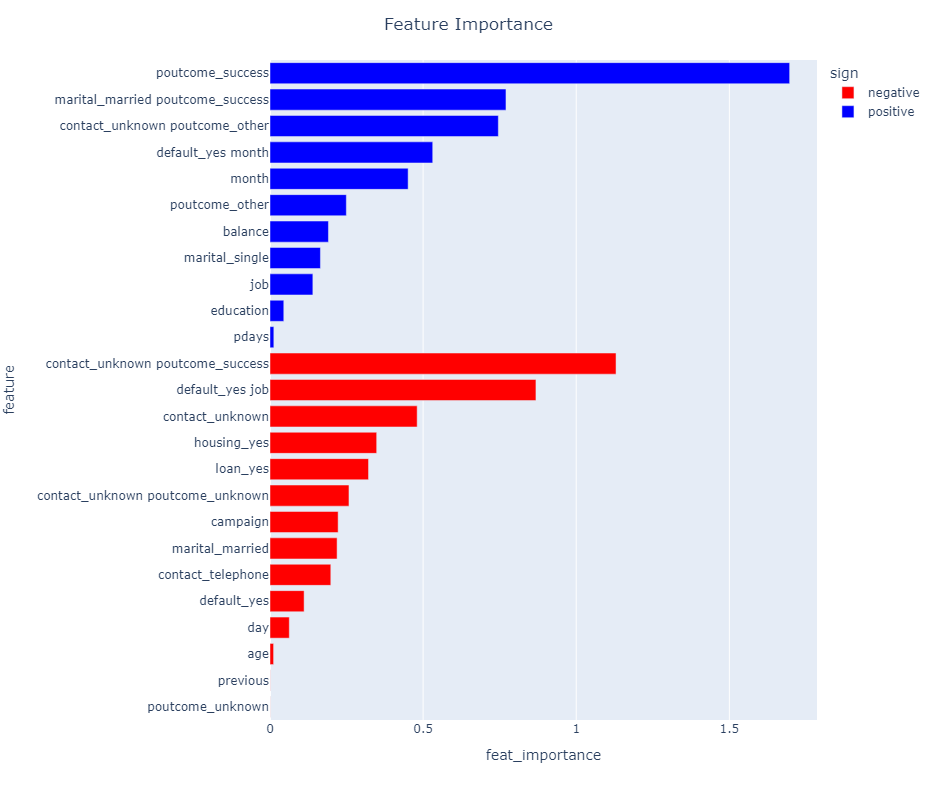

In [66]:
importance = lr.coef_
importance = importance[0]

df_importance = pd.DataFrame({"feature":X_train.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)
df_importance['sign'] = 0
df_importance['sign'][df_importance['importance']>=0] = "positive"
df_importance['sign'][df_importance['importance']<0] = "negative"


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature", color = "sign",orientation='h',  color_discrete_sequence=["red", "blue"],width=800, height=800)
fig.update_layout(
    title_text='Feature Importance',
    title_x=0.5,
)
fig.show()

<a id='6'></a>
## **6. Model Selection**

Now we will try to increase the score of the prediction by computing different models and run hyperparameter tunning. We will run a cross validation using all the dataset. In this case we understand that a splitting into train and test data might be important to avoid overfitting and see if the model fairly generalizes the actual distribution of `deposit` feature; however, we also know that cross validation can help us to avoid overfitting on our model and given that our dataset is not big enough and there is a reserved piece of data completely unseen that can work as a test set, we decided to analyze the results after running the cross validation over the models to train them with as many observations as possible. 

In [67]:
X_fe = X_scaled_fe5

<a id='6.0'></a>
#### **6.0 Logistic Regression**

We will run a cross validation with hyperparameter tunning using `GridSearchCV` method to identify if the model can improve its accuracy with an specific parameter calibration.

In [68]:
parameters = dict(
    penalty=["l2"],
    C=[0.5,0.6,0.7,0.8,0.9,1],
    dual=[False],
    solver=["lbfgs"]
)

tuned_lr = GridSearchCV(
    estimator=LogisticRegression(),
    param_grid=parameters,
    scoring="accuracy",
    cv= 5,
    n_jobs=7,
    return_train_score=True
)

In [69]:
tuned_lr.fit(X_fe, target)

GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=7,
             param_grid={'C': [0.5, 0.6, 0.7, 0.8, 0.9, 1], 'dual': [False],
                         'penalty': ['l2'], 'solver': ['lbfgs']},
             return_train_score=True, scoring='accuracy')

In [70]:
results = pd.DataFrame(tuned_lr.cv_results_)

In [71]:
# Analyze results
test_results = pd.DataFrame(results).filter(regex="split\d_test|mean_test|std_test|param_")
test_results["CoV"] = test_results["std_test_score"]/test_results["mean_test_score"]*100
test_results.sort_values("mean_test_score", ascending=False)

,param_C,param_dual,param_penalty,param_solver,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,CoV
0,0.5,False,l2,lbfgs,0.479624,0.688760,0.782706,0.772401,0.695789,0.683856,0.109077,15.950275
3,0.8,False,l2,lbfgs,0.480072,0.688760,0.782258,0.771953,0.695341,0.683677,0.108746,15.905990
5,1,False,l2,lbfgs,0.480072,0.688760,0.782258,0.771953,0.695341,0.683677,0.108746,15.905990
2,0.7,False,l2,lbfgs,0.480072,0.688312,0.782258,0.771953,0.695341,0.683587,0.108741,15.907483
4,0.9,False,l2,lbfgs,0.480072,0.688760,0.782258,0.771953,0.694892,0.683587,0.108736,15.906690
1,0.6,False,l2,lbfgs,0.479624,0.688760,0.782258,0.771953,0.694892,0.683497,0.108904,15.933304


In [72]:
print(tuned_lr.best_estimator_)
#with its score
print(np.abs(tuned_lr.best_score_))

LogisticRegression(C=0.5)
0.6838558796289608


In [73]:
best = tuned_lr.best_estimator_

The logistic regression after hyperparameter tunning didn't improve its accuracy. The best model after cross validation showed us a worse accuracy than the accuracy when running a simple logistic regression across the train_set. We will explore the next model: Decision Trees

<a id='6.1'></a>
#### **6.1 Decision Tree**

The next model we will evaluate is the decision trees. We will run the `GridSearchCV` over the hyperparameters to get the best results in terms of accuracy.

In [74]:
parameters = dict(
    max_depth=range(2, 15,2),
    min_samples_split=[5,10, 15, 20, 40],
    min_samples_leaf=[4,5,10,15,20, 40]
)

dt = GridSearchCV(
    estimator=DecisionTreeClassifier(),
    param_grid=parameters,
    scoring="accuracy",
    n_jobs=7,
    cv=5,
    return_train_score=True
)

dt.fit(X_fe, target)
results = pd.DataFrame(dt.cv_results_)

In [75]:
# Analyze results
test_results = pd.DataFrame(results).filter(regex="split\d_test|mean_test|std_test|param_")
test_results["CoV"] = test_results["std_test_score"]/test_results["mean_test_score"]*100
test_results.sort_values("mean_test_score", ascending=False)

,param_max_depth,param_min_samples_leaf,param_min_samples_split,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,CoV
86,6,40,10,0.501567,0.630542,0.789427,0.783602,0.717294,0.684486,0.107965,15.773122
89,6,40,40,0.501567,0.630542,0.789427,0.783602,0.717294,0.684486,0.107965,15.773122
88,6,40,20,0.501567,0.630542,0.789427,0.783602,0.717294,0.684486,0.107965,15.773122
87,6,40,15,0.501567,0.630542,0.789427,0.783602,0.717294,0.684486,0.107965,15.773122
85,6,40,5,0.501567,0.630542,0.789427,0.783602,0.717294,0.684486,0.107965,15.773122
...,...,...,...,...,...,...,...,...,...,...,...
150,12,4,5,0.455441,0.618898,0.705645,0.749552,0.697581,0.645423,0.103910,16.099539
186,14,5,10,0.480519,0.616659,0.726254,0.725358,0.675627,0.644884,0.091493,14.187505
181,14,4,10,0.470219,0.618898,0.726703,0.725358,0.681900,0.644616,0.095628,14.834820
185,14,5,5,0.477833,0.617107,0.727151,0.723118,0.674731,0.643988,0.092144,14.308411


In [76]:
print(dt.best_estimator_)
#with its score
print(np.abs(dt.best_score_))

DecisionTreeClassifier(max_depth=6, min_samples_leaf=40, min_samples_split=5)
0.6844863701370931


The decision tree performed marginally better than the logistic regression. In this case, this algorithm was able to find a better selection of the features in order to obtain a better accuracy, but the improvement was not as good as expected. The next family of models we will try are the ensemble methods.

<a id='6.2'></a>
#### **6.2 Bagging - Random Forest**

The first ensemble method we are following is a Random Forest. In this case, given that this ensemble method follows a series of iterations over subsamples of observations and features, we believe that it might improve the prediction because it will try several models, trying to identify the best features (on the random sample) per iteration.

In [77]:
parameters = dict(
    n_estimators=[100],
    max_depth=[2, 5, 10, 14, 16, 20],
    min_samples_split=[5,10, 15, 20, 40],
    min_samples_leaf=[4,5,10,15,20, 40]
)

rf = GridSearchCV(
    estimator=RandomForestClassifier(),
    param_grid=parameters,
    scoring="accuracy",
    n_jobs=7,
    cv=5,
    return_train_score=True
)

rf.fit(X_fe, target)
results = pd.DataFrame(rf.cv_results_)

In [78]:
# Analyze results
test_results = pd.DataFrame(results).filter(regex="split\d_test|mean_test|std_test|param_")
test_results["CoV"] = test_results["std_test_score"]/test_results["mean_test_score"]*100
test_results.sort_values("mean_test_score", ascending=False)

,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_n_estimators,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,CoV
64,10,4,40,100,0.462159,0.669503,0.830645,0.831989,0.743280,0.707515,0.136805,19.336051
98,14,5,20,100,0.467085,0.671294,0.831093,0.830197,0.737455,0.707425,0.134415,19.000666
95,14,5,5,100,0.462606,0.670399,0.839158,0.824821,0.739695,0.707336,0.136736,19.331138
60,10,4,5,100,0.466637,0.666368,0.834677,0.828853,0.739695,0.707246,0.135384,19.142379
68,10,5,20,100,0.469324,0.660099,0.833333,0.832885,0.739247,0.706978,0.135305,19.138473
...,...,...,...,...,...,...,...,...,...,...,...,...
3,2,4,20,100,0.415137,0.575459,0.756272,0.774194,0.683692,0.640951,0.132786,20.717052
12,2,10,15,100,0.416480,0.577250,0.761201,0.776434,0.672491,0.640771,0.132857,20.733949
17,2,15,15,100,0.415137,0.577250,0.752240,0.773746,0.685036,0.640682,0.131919,20.590362
2,2,4,15,100,0.417824,0.570533,0.758065,0.768369,0.684588,0.639876,0.131601,20.566631


In [79]:
print(rf.best_estimator_)
#with its score
print(np.abs(rf.best_score_))

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=40)
0.7075150841001786


The model imprved considerably with respect to the logistic regression and decission trees (+0.25). We will get the feature importance for this model given that its a potential candidate to be the best model. 

In [80]:
best = rf.best_estimator_
best.fit(X_fe, target)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=40)

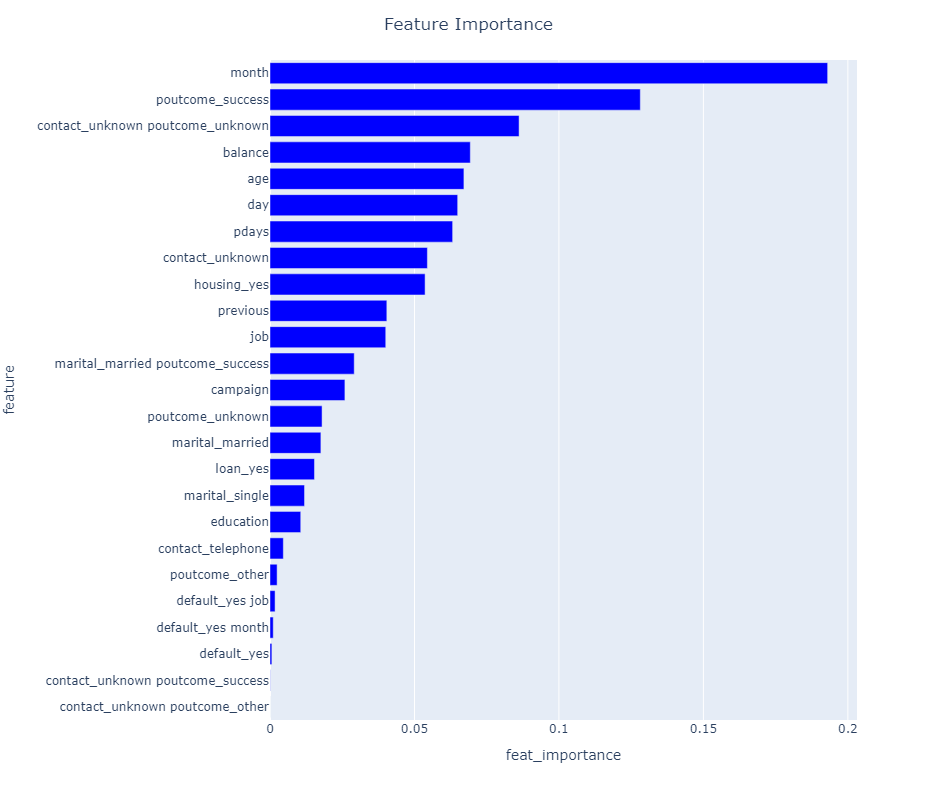

In [81]:
importance = best.feature_importances_
#importance = importance[0]

df_importance = pd.DataFrame({"feature":X_fe.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature",orientation='h',  color_discrete_sequence=["blue", "red"],width=800, height=800)
fig.update_layout(
    title_text='Feature Importance',
    title_x=0.5,
)
fig.show()

In this case the feature importance is measured as the Gini Index and that is why there is no distinction between positive and negative values. Right before moving on to the feature selection part, we will continue with the next ensemble method. 

<a id='6.3'></a>
#### **6.3 Boosting - Gradient Boosting Machine**

In [82]:
%%time
parameters = dict(
    n_estimators=[100],
    learning_rate = [0.01],
    max_features=['log2'],
    min_samples_leaf=[5,10,15,20,40],
    min_samples_split=[5,10,15,20,40],
    max_depth=[4,8,12,16], 
    random_state=[123],
    criterion=['friedman_mse']
)

gb = GridSearchCV(
    estimator=GradientBoostingClassifier(),
    param_grid=parameters,
    scoring="accuracy",
    n_jobs=7,
    return_train_score=True
)


gb.fit(X_fe, target)
results = pd.DataFrame(gb.cv_results_)

CPU times: total: 3.92 s
Wall time: 2min 52s


In [83]:
# Analyze results
test_results = pd.DataFrame(results).filter(regex="split\d_test|mean_test|std_test|param_")
test_results["CoV"] = test_results["std_test_score"]/test_results["mean_test_score"]*100
test_results.sort_values("mean_test_score", ascending=False)

,param_criterion,param_learning_rate,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,param_random_state,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,CoV
52,friedman_mse,0.01,12,log2,5,15,100,123,0.473354,0.667264,0.825717,0.838710,0.741487,0.709306,0.133247,18.785473
54,friedman_mse,0.01,12,log2,5,40,100,123,0.473354,0.665920,0.833781,0.834229,0.737007,0.708858,0.133732,18.865892
53,friedman_mse,0.01,12,log2,5,20,100,123,0.472459,0.671742,0.828405,0.829749,0.741039,0.708679,0.132064,18.635177
59,friedman_mse,0.01,12,log2,10,40,100,123,0.470219,0.673086,0.830197,0.827509,0.738351,0.707872,0.132585,18.730107
79,friedman_mse,0.01,16,log2,5,40,100,123,0.470667,0.663233,0.831093,0.832885,0.739247,0.707425,0.134204,18.970802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21,friedman_mse,0.01,4,log2,40,10,100,123,0.445141,0.618003,0.799283,0.810484,0.715950,0.677772,0.135296,19.961810
20,friedman_mse,0.01,4,log2,40,5,100,123,0.445141,0.618003,0.799283,0.810484,0.715950,0.677772,0.135296,19.961810
23,friedman_mse,0.01,4,log2,40,20,100,123,0.445141,0.618003,0.799283,0.810484,0.715950,0.677772,0.135296,19.961810
24,friedman_mse,0.01,4,log2,40,40,100,123,0.445141,0.618003,0.799283,0.810484,0.715950,0.677772,0.135296,19.961810


In [84]:
print(gb.best_estimator_)
#with its score
print(np.abs(gb.best_score_))

GradientBoostingClassifier(learning_rate=0.01, max_depth=12,
                           max_features='log2', min_samples_leaf=5,
                           min_samples_split=15, random_state=123)
0.7093063962363184


The Gradient Boosting performs marginally better than the Random Forest. We will get the feature importance for this model given that its a potential candidate to be the best model. 

In [85]:
best = gb.best_estimator_
best.fit(X_fe, target)

GradientBoostingClassifier(learning_rate=0.01, max_depth=12,
                           max_features='log2', min_samples_leaf=5,
                           min_samples_split=15, random_state=123)

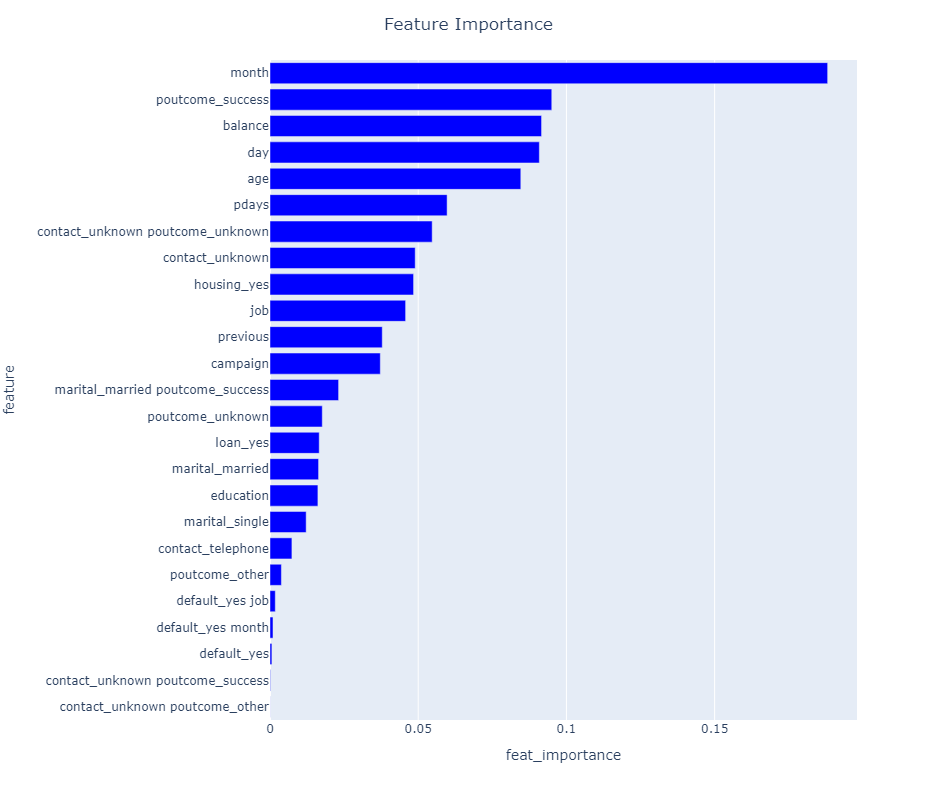

In [86]:
importance = best.feature_importances_
#importance = importance[0]

df_importance = pd.DataFrame({"feature":X_fe.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature",orientation='h',  color_discrete_sequence=["blue", "red"],width=800, height=800)
fig.update_layout(
    title_text='Feature Importance',
    title_x=0.5,
)
fig.show()

The feature importance is mainly the same as in the Random Forest.

<a id='6.4'></a>
#### **6.4 Boosting - XG Boost - CHOSEN MODEL**

Now we will develop an XG Boost algorithm. In this case, this algorithm has the advangtage to be very efficient in terms of computing processing and we will be able to run the hyperparameter tunning in a faster way to improve the accuracy of the model.

In this case, given that XG Boost is not a library from SKLearn, we used the `optuna` library for hyperparameter tunning (more efficient than the GridSearchCV). The idea behind the  XGBoost is the same as in the gradient boosting but with a higher level of regularization (l1 &  l2) and also is more efficient in terms of processing. This approach performs better for large datasets and small number of features (number of observations > number of features).

Given that optuna is a new library that we are using for hyperparameter tunning for the XG Boost model, we inspired our code on an online reference where a `XGBReggression` was computed. We adapted the model to a `XGBClassifier`.

reference: https://www.kaggle.com/code/hamzaghanmi/xgboost-catboost-using-optuna#3.-XGBoost-using-Optuna-

**Defining the parameters**

In [87]:
def objective(trial,data=X_fe,target=target):
    
    train_x, test_x, train_y, test_y = train_test_split(data, target, test_size=0.15,random_state=42)
    param = {
        'tree_method':'hist',  #An approximation of tree method used in LightGBM, sketch the tree before the train
        'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0), #L2 regularization term on weights
        'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),  #L1 regularization term on weights
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.3,0.4,0.5,0.6,0.7,0.8,0.9, 1.0]), #Subsample ratio of columns when constructing each tree.
        'subsample': trial.suggest_categorical('subsample', [0.4,0.5,0.6,0.7,0.8,1.0]), #Subsample ratio of the training instance.
        'learning_rate': trial.suggest_categorical('learning_rate', [0.008,0.01,0.012,0.014,0.016,0.018, 0.02]), #metric for defining how fast the model learns. 
        'n_estimators': 1000, # the number of trees that will be train for the model
        'max_depth': trial.suggest_categorical('max_depth', [15,9,11,13,15,17,20]), #maximum depth per tree
        'random_state': trial.suggest_categorical('random_state', [2020]), #for reproductibilty purposes
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 300), #minimum sample on a leaf to stop splitting
    }
    model = xgb.XGBClassifier(**param)  
    
    model.fit(train_x, train_y, eval_set=[(test_x,test_y)] ,early_stopping_rounds=100,verbose=False)
    
    preds = model.predict(test_x)
    
    accuracy = accuracy_score(test_y, preds) #the score we are trying to maximize
    
    return accuracy

**Creating the iterations over the different hyperparameters**

In [88]:
sampler = TPESampler(seed=10)
study = optuna.create_study(sampler = sampler, direction='maximize')
study.optimize(objective, n_trials=10)
#print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
study.trials_dataframe()

[I 2022-11-10 21:02:06,500] A new study created in memory with name: no-name-4984875a-a2a6-4a8d-a8e3-c3452c78098d
[I 2022-11-10 21:02:08,552] Trial 0 finished with value: 0.6883582089552239 and parameters: {'lambda': 1.216977567770054, 'alpha': 0.0012106198691436032, 'colsample_bytree': 0.8, 'subsample': 0.5, 'learning_rate': 0.012, 'max_depth': 15, 'random_state': 2020, 'min_child_weight': 242}. Best is trial 0 with value: 0.6883582089552239.
[I 2022-11-10 21:02:10,491] Trial 1 finished with value: 0.6943283582089552 and parameters: {'lambda': 0.12206428444236327, 'alpha': 4.311173720055822, 'colsample_bytree': 0.7, 'subsample': 0.6, 'learning_rate': 0.008, 'max_depth': 11, 'random_state': 2020, 'min_child_weight': 271}. Best is trial 1 with value: 0.6943283582089552.
[I 2022-11-10 21:02:12,954] Trial 2 finished with value: 0.7414925373134328 and parameters: {'lambda': 0.1374775535690856, 'alpha': 0.2295120287772858, 'colsample_bytree': 0.8, 'subsample': 0.8, 'learning_rate': 0.008, '

Best trial: {'lambda': 0.06711044850912154, 'alpha': 0.04651506457397831, 'colsample_bytree': 0.6, 'subsample': 0.8, 'learning_rate': 0.01, 'max_depth': 13, 'random_state': 2020, 'min_child_weight': 8}


,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_random_state,params_subsample,state
0,0,0.688358,2022-11-10 21:02:06.502078,2022-11-10 21:02:08.552403,0 days 00:00:02.050325,0.001211,0.8,1.216978,0.012,15,242,2020,0.5,COMPLETE
1,1,0.694328,2022-11-10 21:02:08.552904,2022-11-10 21:02:10.491579,0 days 00:00:01.938675,4.311174,0.7,0.122064,0.008,11,271,2020,0.6,COMPLETE
2,2,0.741493,2022-11-10 21:02:10.491579,2022-11-10 21:02:12.954129,0 days 00:00:02.462550,0.229512,0.8,0.137478,0.008,15,20,2020,0.8,COMPLETE
3,3,0.693731,2022-11-10 21:02:12.958437,2022-11-10 21:02:15.085884,0 days 00:00:02.127447,0.022847,0.4,8.227665,0.014,11,224,2020,0.5,COMPLETE
4,4,0.742090,2022-11-10 21:02:15.085884,2022-11-10 21:02:16.817227,0 days 00:00:01.731343,0.247185,0.5,0.075708,0.014,20,28,2020,1.0,COMPLETE
5,5,0.702687,2022-11-10 21:02:16.825791,2022-11-10 21:02:19.161385,0 days 00:00:02.335594,0.182182,1.0,1.585897,0.008,20,223,2020,0.7,COMPLETE
6,6,0.747463,2022-11-10 21:02:19.172733,2022-11-10 21:02:21.205998,0 days 00:00:02.033265,0.046515,0.6,0.067110,0.010,13,8,2020,0.8,COMPLETE
7,7,0.735522,2022-11-10 21:02:21.205998,2022-11-10 21:02:22.474182,0 days 00:00:01.268184,0.005477,0.5,0.001573,0.020,17,19,2020,0.4,COMPLETE
8,8,0.721791,2022-11-10 21:02:22.474182,2022-11-10 21:02:24.707803,0 days 00:00:02.233621,0.008225,0.7,9.029587,0.020,9,192,2020,1.0,COMPLETE
9,9,0.714627,2022-11-10 21:02:24.707803,2022-11-10 21:02:26.993661,0 days 00:00:02.285858,0.149231,0.5,0.001089,0.008,15,209,2020,1.0,COMPLETE


**Store the best hyperparameters**

In [89]:
Best_trial = study.best_trial.params
Best_trial["n_estimators"], Best_trial["tree_method"] = 10000, 'hist'
Best_trial

{'lambda': 0.06711044850912154,
 'alpha': 0.04651506457397831,
 'colsample_bytree': 0.6,
 'subsample': 0.8,
 'learning_rate': 0.01,
 'max_depth': 13,
 'random_state': 2020,
 'min_child_weight': 8,
 'n_estimators': 10000,
 'tree_method': 'hist'}

**Computing the accuracy with cross validation**

In [90]:
X_train, X_test, y_train, y_test = train_test_split(X_fe, target, test_size=0.2, random_state=123)
preds = np.zeros(X_test.shape[0])
kf = KFold(n_splits=5,random_state=48,shuffle=True)
acc=[]  # list contains rmse for each fold
n=0
for trn_idx, test_idx in kf.split(X_train[X_train.columns],y_train):
    X_tr,X_val=X_train[X_train.columns].iloc[trn_idx],X_train[X_train.columns].iloc[test_idx]
    y_tr,y_val=y_train.iloc[trn_idx],y_train.iloc[test_idx]
    model = xgb.XGBClassifier(**Best_trial)
    model.fit(X_tr,y_tr,eval_set=[(X_val,y_val)],early_stopping_rounds=100,verbose=False)
    preds+=model.predict(X_test[X_train.columns])/kf.n_splits
    acc.append(accuracy_score(y_val, model.predict(X_val)))
    print(f"fold: {n+1} ==> Accuracy: {acc[n]}")
    n+=1

fold: 1 ==> Accuracy: 0.7541993281075028
fold: 2 ==> Accuracy: 0.729003359462486
fold: 3 ==> Accuracy: 0.7486002239641657
fold: 4 ==> Accuracy: 0.7357222844344905
fold: 5 ==> Accuracy: 0.7478991596638656


In [91]:
print (f'The mean accuracy is {round(sum(acc)/len(acc),3)}')

The mean accuracy is 0.743


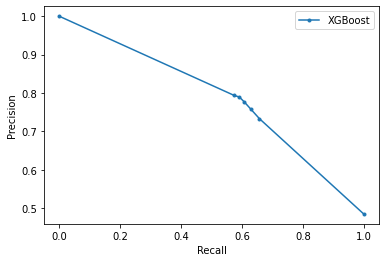

In [92]:
# make precision recall tradeoff curve
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test, preds)
plt.plot(recall, precision, marker='.', label='XGBoost')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()

With this model the accuracy improves a lot compared to the previous models tried. On average the accuracy improves from 0.709 to 0.743, which is the best model (and hyperparameters) we could find

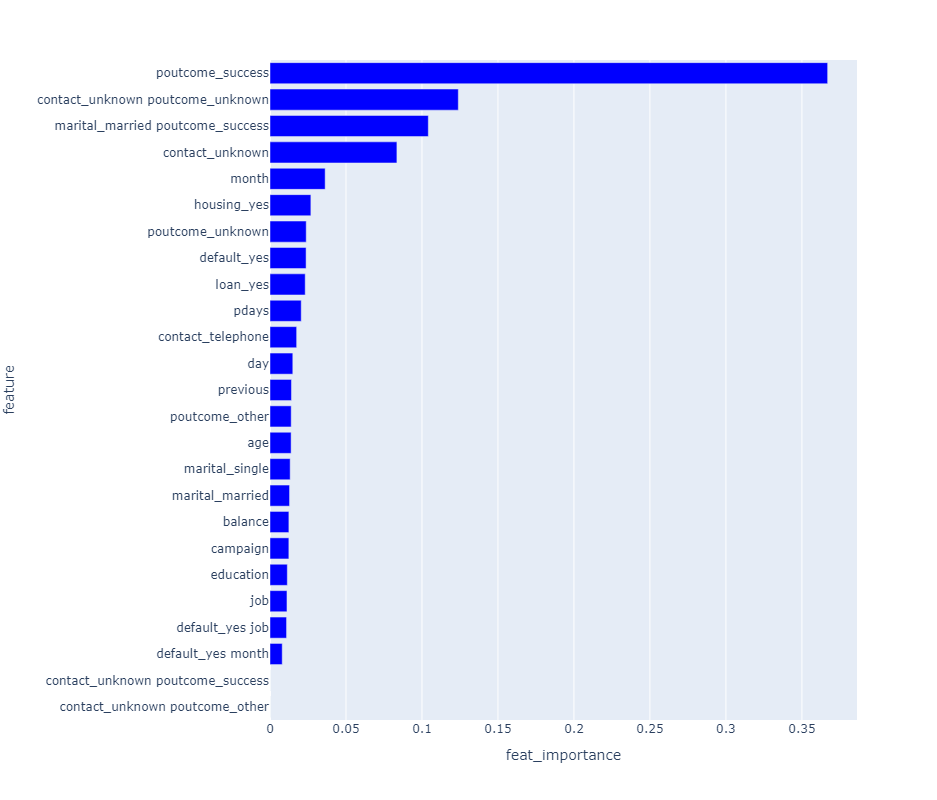

In [93]:
importance = model.feature_importances_
#importance = importance[0]

df_importance = pd.DataFrame({"feature":X_fe.columns,"importance":importance})
df_importance['feat_importance'] = np.abs(df_importance.importance)


fig = px.bar(df_importance.sort_values(by = "feat_importance"), x="feat_importance", y="feature",orientation='h',  color_discrete_sequence=["blue", "red"],width=800, height=800)

fig.show()

The feature importance for the XGBoost model is different from the previous ensembled methods tried. In this case, the most important feature by far is `poutcome_success`, which was the main feature when we were running the logistic regressions through the Feature Engineering part. And the second most important is `contact_unknown poutcome_unknown` which was also one of the main features over the previous models tried.

<a id='7'></a>
## **7. Feature Selection**

We have seen that some features perform much better than others, based on the model selection part. Now we will identify the features that probably do not add additional variance to the model and can be removed, even because they add noise to the model or have the same information as other features in the model.

We will study again the correlation matrix troughout the numerical variables to see if we can identify some collinearity that reduces the importance of some features.

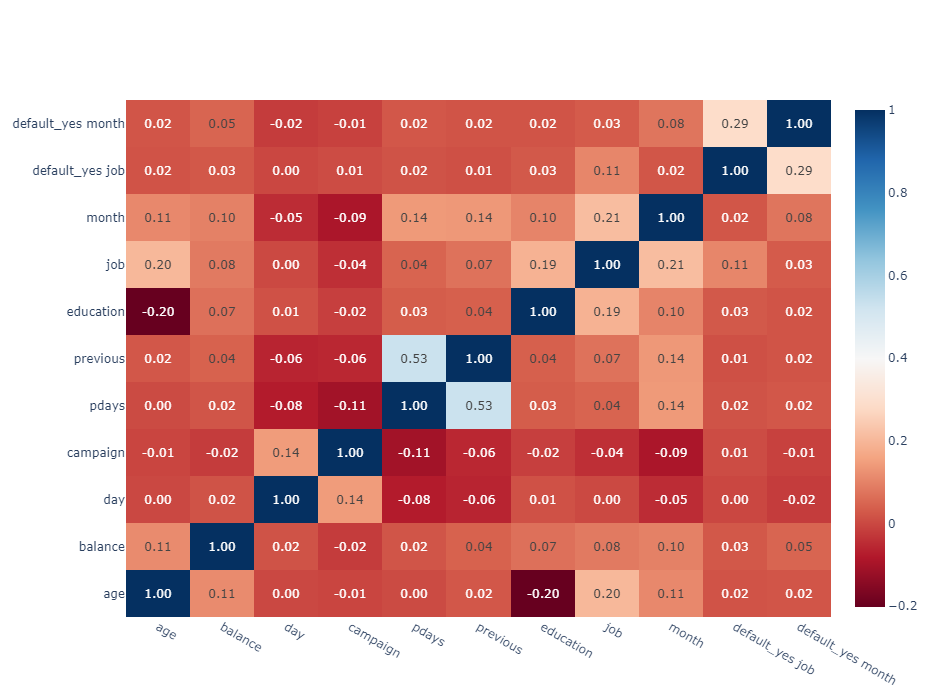

In [94]:
numerical_features = ["age", "balance","day", "campaign", "pdays","previous","education","job","month","default_yes job","default_yes month"]

num_features = X_fe[numerical_features]

df_corr = num_features.corr()

fig = go.Figure()
fig.add_trace(
    go.Heatmap(
        x = num_features.columns,
        y = num_features.columns,
        z = np.array(df_corr),
        text=df_corr.values,
        texttemplate='%{text:.2f}',
        colorscale="RdBu",
    )
)
fig.update_layout(
    autosize=False,
    width=1200,
    height=700,)
fig.show()

Given the new correlation matrix that considers the rescaled features and the relevant interaction between them, there is not a very high correlation between any of the feautres (all of them below 0.55) which means that there is not a considerable problem of multicolinearity.

Having said that, we will focus the feature selection process with the feature importance obtained in the XGBoost model. We will delete the least important feature and evaluate the accuracy of the model; then, we will try to delete the second least important and repeat the process. We will try it until the Accuracy does not improve more (if applies).

**First we will delete:** `contact_unknown poutcome_other` 

###### (*)On the next hidden cell there is a function that builds the modelling process in order to not repeat all the steps any time we retrain the model

In [95]:
#We are creating a function in order to not repeat the same process many times in the feature selection part.
def feature_selection(df):
    def objective(trial,data=df,target=target):

        train_x, test_x, train_y, test_y = train_test_split(data, target, test_size=0.15,random_state=42)
        param = {
            'tree_method':'hist',  #An approximation of tree method used in LightGBM, sketch the tree before the train
            'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0), #L2 regularization term on weights
            'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),  #L1 regularization term on weights
            'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.3,0.4,0.5,0.6,0.7,0.8,0.9, 1.0]), #Subsample ratio of columns when constructing each tree.
            'subsample': trial.suggest_categorical('subsample', [0.4,0.5,0.6,0.7,0.8,1.0]), #Subsample ratio of the training instance.
            'learning_rate': trial.suggest_categorical('learning_rate', [0.008,0.01,0.012,0.014,0.016,0.018, 0.02]), #metric for defining how fast the model learns. 
            'n_estimators': 1000, # the number of trees that will be train for the model
            'max_depth': trial.suggest_categorical('max_depth', [15,9,11,13,15,17,20]), #maximum depth per tree
            'random_state': trial.suggest_categorical('random_state', [2020]), #for reproductibilty purposes
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 300), #minimum sample on a leaf to stop splitting
        }
        model = xgb.XGBClassifier(**param)  

        model.fit(train_x, train_y, eval_set=[(test_x,test_y)] ,early_stopping_rounds=100,verbose=False)

        preds = model.predict(test_x)

        accuracy = accuracy_score(test_y, preds) #the score we are trying to minimize

        return accuracy

    optuna.logging.set_verbosity(optuna.logging.WARNING)
    
   
    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials=10)
    #print('Number of finished trials:', len(study.trials))
    Best_trial = study.best_trial.params
    Best_trial["n_estimators"], Best_trial["tree_method"] = 10000, 'hist'
    Best_trial

    X_train, X_test, y_train, y_test = train_test_split(X_fs1, target, test_size=0.2, random_state=123)
    preds = np.zeros(X_test.shape[0])
    kf = KFold(n_splits=5,random_state=48,shuffle=True)
    acc=[]  # list contains rmse for each fold
    n=0
    for trn_idx, test_idx in kf.split(X_train[X_train.columns],y_train):
        X_tr,X_val=X_train[X_train.columns].iloc[trn_idx],X_train[X_train.columns].iloc[test_idx]
        y_tr,y_val=y_train.iloc[trn_idx],y_train.iloc[test_idx]
        model = xgb.XGBClassifier(**Best_trial)
        model.fit(X_tr,y_tr,eval_set=[(X_val,y_val)],early_stopping_rounds=100,verbose=False)
        preds+=model.predict(X_test[X_train.columns])/kf.n_splits
        acc.append(accuracy_score(y_val, model.predict(X_val)))
        print(f"fold: {n+1} ==> Accuracy: {acc[n]}")
        n+=1

    print (f'The mean accuracy is {round(sum(acc)/len(acc),3)}')

In [96]:
X_fs1 = X_fe.drop(columns = 'contact_unknown poutcome_other')
feature_selection(X_fs1)

fold: 1 ==> Accuracy: 0.7340425531914894
fold: 2 ==> Accuracy: 0.7323628219484882
fold: 3 ==> Accuracy: 0.7362821948488242
fold: 4 ==> Accuracy: 0.7340425531914894
fold: 5 ==> Accuracy: 0.7394957983193278
The mean accuracy is 0.735


The model did not improve with respect to the original one. This means that the feature `contact_unknown previous`, even if it is the least important one of the explanatory features, it adds necessary information to the model in order to improve its accuracy. We will try removing the second least important feature.

**Second, we will delete:** `contact_unknown poutcome_success` 

In [97]:
X_fs2 = X_fe.drop(columns = 'contact_unknown poutcome_success')
feature_selection(X_fs2)

fold: 1 ==> Accuracy: 0.7301231802911534
fold: 2 ==> Accuracy: 0.7284434490481523
fold: 3 ==> Accuracy: 0.7239641657334827
fold: 4 ==> Accuracy: 0.723404255319149
fold: 5 ==> Accuracy: 0.7389355742296919
The mean accuracy is 0.729


The model did not improve with respect to the original one. This means that the feature `contact_unknown poutcome_success`, even if it is the second least important one of the explanatory features, it adds necessary information to the model in order to improve its accuracy. The fact that the marketing area does not know the source of contact but they had success on previous campaigns implies that this customer might be interesting for the company and might increase the likelihood of accepting the bank offer.

**Third, we will delete:** `default_yes month` 

In [98]:
X_fs3 = X_fe.drop(columns = 'default_yes month')
feature_selection(X_fs3)

fold: 1 ==> Accuracy: 0.7351623740201568
fold: 2 ==> Accuracy: 0.7312430011198209
fold: 3 ==> Accuracy: 0.7334826427771557
fold: 4 ==> Accuracy: 0.7329227323628219
fold: 5 ==> Accuracy: 0.7372549019607844
The mean accuracy is 0.734


The model did not improve with respect to the original one. This means that the feature `default_yes month`, even if it is the third least important one of the explanatory features, it adds necessary information to the model in order to improve its accuracy. The fact that a client has defaulted and the specific month of the year are important factors to know if this customer will accept the term deposit, probably because the client might be involved in higher expenses depending the month it is, this might lead to higher financial problems depending on the circumstances of the client. To summarize, we keep all the features used in the original model in order to keep the accuracy at levels higher than 0.743.

<a id='8'></a>
## **8. Summary and Explanation**

## We began the exercise with a phase of 'understanding'. Firstly, understanding the business problem we were facing so that we could secondly understand which data we were dealing with so that then we could think of potential solutions.
## After doing so, we started to work on the potential solutions. To do so, we first had to establish a baseline model against which we would compare and try to improve.
## It was probably the next step the one that challenged us the most. Specificity of the features lead us to multiple experimentation with trials and errors.
## We then proceeded to the modelling part where we also experimented over several clasification models and compared them. We ended up choosing XG Boost given the relative better results.
## In the last point, we focused on the feature selection; however, we identified that all the features were relevant to the model because when we remove any feature from the model, it performed worse compared to the original one, that is why we decided to keep all the features we used after the feature engineering part.
## We would like to make a last remark linking the models back to the business side of the exercise. Though it's not defined in the documentation, we would assume that the clasification model would be applied to predict future prospects, and the bank would only call those that the model would predict as 'positives'. If this were the case, then we would have to play with thresholds and train our model to try to maximize True Positives (TP) while minimizing the (FN), of course assuming a larger number of False Positive (FP). This reasoning would apply under the assumption that the marginal cost of calling a FP is lower than the marginal lost revenue of not contacting a FN.   